In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.compose import make_column_selector, make_column_transformer, ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import mean_squared_error
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.forecasting.stl import STLForecast
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.tsa.arima_process as arima_process
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import acf, pacf
import statsmodels.graphics.tsaplots as tsaplots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.filters.filtertools import convolution_filter

import pickle
from warnings import filterwarnings 
filterwarnings('ignore')

In [2]:
dt_df = pd.read_csv('Downtime_Data.csv')

In [3]:
dt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123860 entries, 0 to 123859
Data columns (total 23 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   Date                              123809 non-null  object 
 1   Shift                             123475 non-null  float64
 2   Period                            123771 non-null  float64
 3   Week                              123771 non-null  float64
 4   Asset                             123860 non-null  object 
 5   Category                          123829 non-null  object 
 6   Minutes                           123651 non-null  float64
 7   Comments                          101805 non-null  object 
 8   Line                              121719 non-null  object 
 9   Daily DT/ Shift (Mins)            120463 non-null  float64
 10  Availability                      123826 non-null  float64
 11  Normalized DT/ Shift Period View  120461 non-null  f

In [4]:
dt_df.head()

,Date,Shift,Period,Week,Asset,Category,Minutes,Comments,Line,Daily DT/ Shift (Mins),...,WorkingDay,PeriodAvgDT/Shift,Defect,WeekNum,Year,Year_Week_Calc,Counter_wk,Counter_Pd,Category (groups),Period_View
0,1/24/2022,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 frame damaged on line,DG1,3.692308,...,0.027239,0.445665,NaN,5.0,2022.0,2022-5,79,17,Other,1.0
1,1/24/2022,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 damaged sill,DG1,3.692308,...,0.027239,0.445665,NaN,5.0,2022.0,2022-5,79,17,Other,1.0
2,1/24/2022,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 bad glass- sightline from supplier 811948-7 ...,DG1,3.692308,...,0.027239,0.445665,NaN,5.0,2022.0,2022-5,79,17,Other,1.0
3,1/26/2022,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 Frame Gap,DG1,3.000000,...,0.027239,0.445665,NaN,5.0,2022.0,2022-5,79,17,Other,1.0
4,1/27/2022,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 lower interior m&t gap,DG1,3.000000,...,0.027239,0.445665,NaN,5.0,2022.0,2022-5,79,17,Other,1.0


In [5]:
df = dt_df.copy()

In [6]:
df['Date'] = pd.to_datetime(df['Date'])

In [7]:
df.dropna(subset = ['Date','Asset','Line'], inplace = True)

In [8]:
df.drop('Defect', axis = 1, inplace = True)

In [9]:
df['count'] = 1

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 121668 entries, 0 to 123859
Data columns (total 23 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   Date                              121668 non-null  datetime64[ns]
 1   Shift                             121345 non-null  float64       
 2   Period                            121625 non-null  float64       
 3   Week                              121625 non-null  float64       
 4   Asset                             121668 non-null  object        
 5   Category                          121637 non-null  object        
 6   Minutes                           121459 non-null  float64       
 7   Comments                          100958 non-null  object        
 8   Line                              121668 non-null  object        
 9   Daily DT/ Shift (Mins)            120462 non-null  float64       
 10  Availability                    

In [11]:
df.head()

,Date,Shift,Period,Week,Asset,Category,Minutes,Comments,Line,Daily DT/ Shift (Mins),...,WorkingDay,PeriodAvgDT/Shift,WeekNum,Year,Year_Week_Calc,Counter_wk,Counter_Pd,Category (groups),Period_View,count
0,2022-01-24,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 frame damaged on line,DG1,3.692308,...,0.027239,0.445665,5.0,2022.0,2022-5,79,17,Other,1.0,1
1,2022-01-24,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 damaged sill,DG1,3.692308,...,0.027239,0.445665,5.0,2022.0,2022-5,79,17,Other,1.0,1
2,2022-01-24,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 bad glass- sightline from supplier 811948-7 ...,DG1,3.692308,...,0.027239,0.445665,5.0,2022.0,2022-5,79,17,Other,1.0,1
3,2022-01-26,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 Frame Gap,DG1,3.000000,...,0.027239,0.445665,5.0,2022.0,2022-5,79,17,Other,1.0,1
4,2022-01-27,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 lower interior m&t gap,DG1,3.000000,...,0.027239,0.445665,5.0,2022.0,2022-5,79,17,Other,1.0,1


In [12]:
df['Category (groups)'].value_counts()

Other      94186
Machine    27451
(Blank)       31
Name: Category (groups), dtype: int64

In [13]:
#z = df.groupby(by = ['Line', 'Asset','Date'])[['Minutes']].sum().reset_index()
group_by_category = 'WeekNum'
z = df.where(df['Category (groups)'] == 'Machine').groupby(by = ['Line', 'Asset',group_by_category])[['Minutes','count']].sum().reset_index()

In [14]:
z['Line_Asset'] = z['Line']+'-'+z['Asset']

In [15]:
z.sort_values(by = ['Line','Asset',group_by_category], inplace = True)

In [16]:
z['Line'].value_counts()

DG1     1422
DG2     1330
DB2     1206
GL1      855
CS1      815
DB1      803
GL2      732
PW1      443
SPW1     243
BM       121
Name: Line, dtype: int64

In [17]:
z

,Line,Asset,WeekNum,Minutes,count,Line_Asset
0,BM,BM A Area,9.0,60.0,1.0,BM-BM A Area
1,BM,BM A Area,14.0,10.0,1.0,BM-BM A Area
2,BM,BM A Area,15.0,40.0,2.0,BM-BM A Area
3,BM,BM A Area,17.0,60.0,1.0,BM-BM A Area
4,BM,BM A Area,18.0,120.0,1.0,BM-BM A Area
...,...,...,...,...,...,...
7965,SPW1,spw welding station,37.0,10.0,1.0,SPW1-spw welding station
7966,SPW1,spw welding station,47.0,30.0,1.0,SPW1-spw welding station
7967,SPW1,spw welding station,49.0,15.0,1.0,SPW1-spw welding station
7968,SPW1,spw welding station,51.0,60.0,1.0,SPW1-spw welding station


In [18]:
line = z.groupby(by = 'Line')[['Minutes','count']].count().reset_index()

line

,Line,Minutes,count
0,BM,121,121
1,CS1,815,815
2,DB1,803,803
3,DB2,1206,1206
4,DG1,1422,1422
5,DG2,1330,1330
6,GL1,855,855
7,GL2,732,732
8,PW1,443,443
9,SPW1,243,243


In [19]:
# Creating lists for various Lines and factors that would be evaluated and used for modelling

line_list = line['Line']

#code_list = ['Entire GL1 Line','GL1 Frame Clamp 40000692','GL1 Glass Lay In Station','GL1 Frame Clamp 40000692','GL1 Sash Clamp 40000690','GL1 Bander C#######']

#code_list = ['DG1 Interior Sash Saw 40035582','DG1 Lift and Lock Drill Balancer Apply 40036631','DG1 Sash Accumulator 40036629']

factor_list = ['Minutes','count']

In [20]:
list(line_list)

['BM', 'CS1', 'DB1', 'DB2', 'DG1', 'DG2', 'GL1', 'GL2', 'PW1', 'SPW1']

In [21]:
line = z.where(z['Line'] != 'BM').groupby(by = 'Line')[['Minutes','count']].count().reset_index()
line_list = list(line['Line'])
line_list

['CS1', 'DB1', 'DB2', 'DG1', 'DG2', 'GL1', 'GL2', 'PW1', 'SPW1']

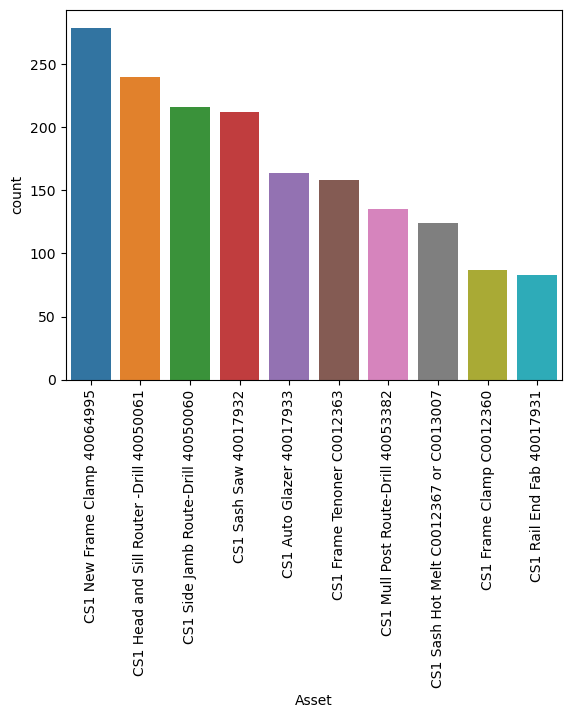

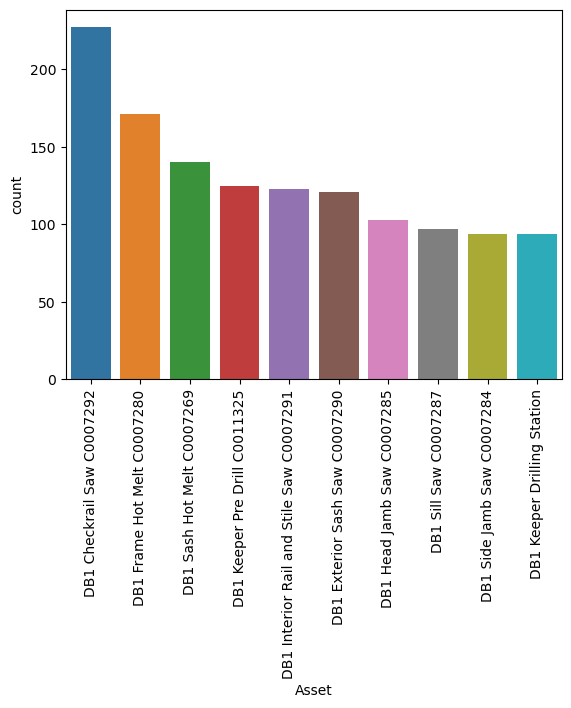

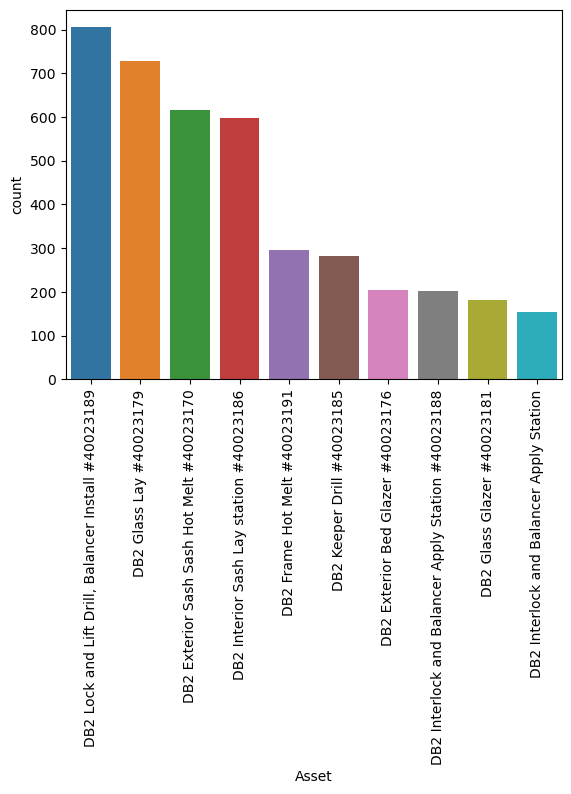

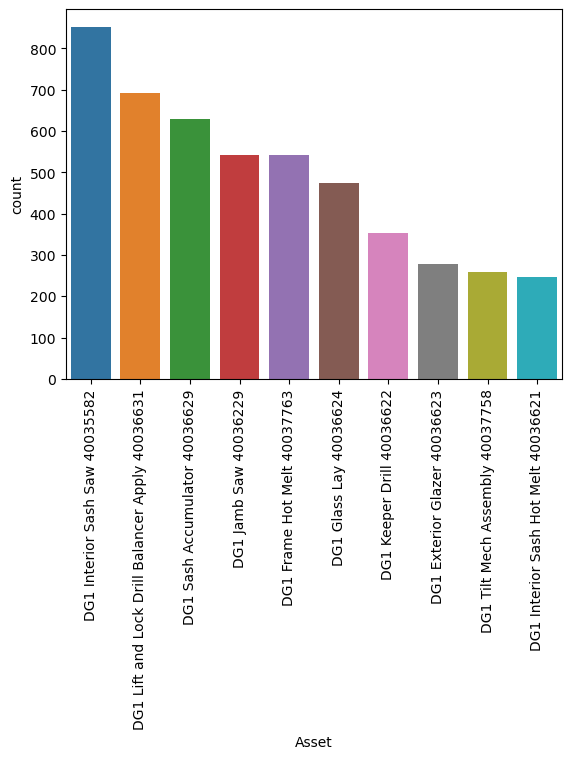

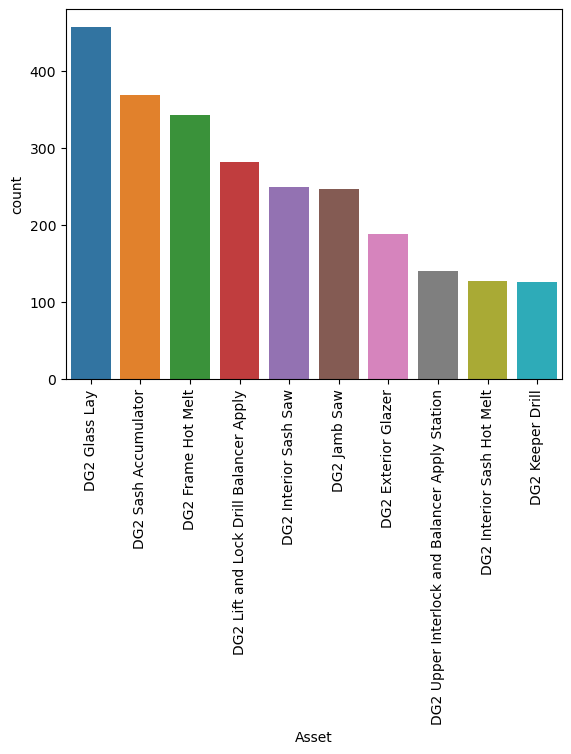

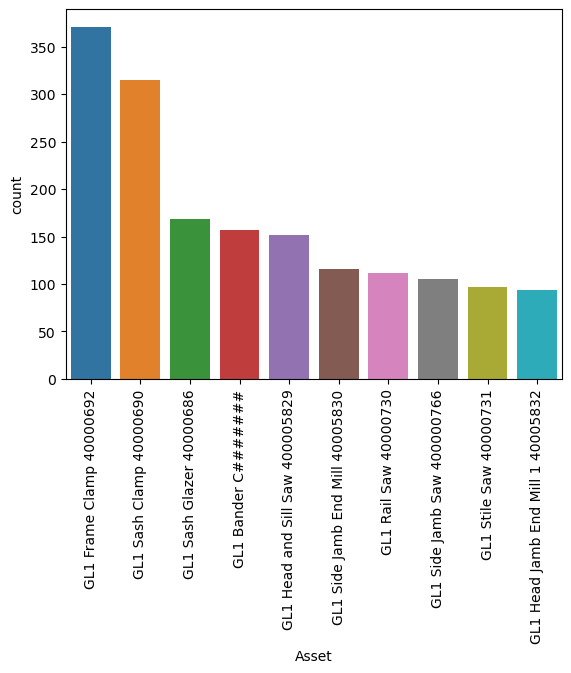

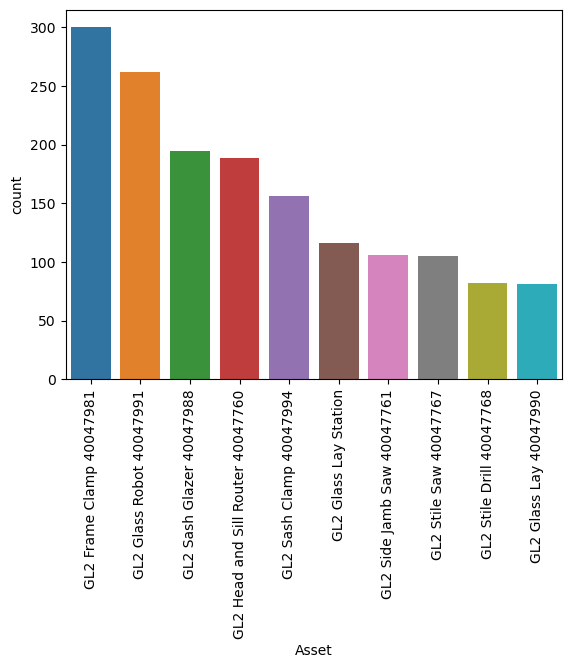

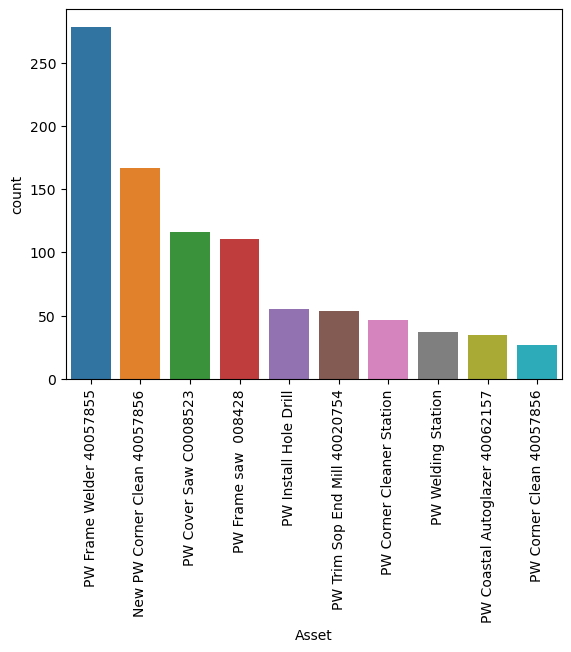

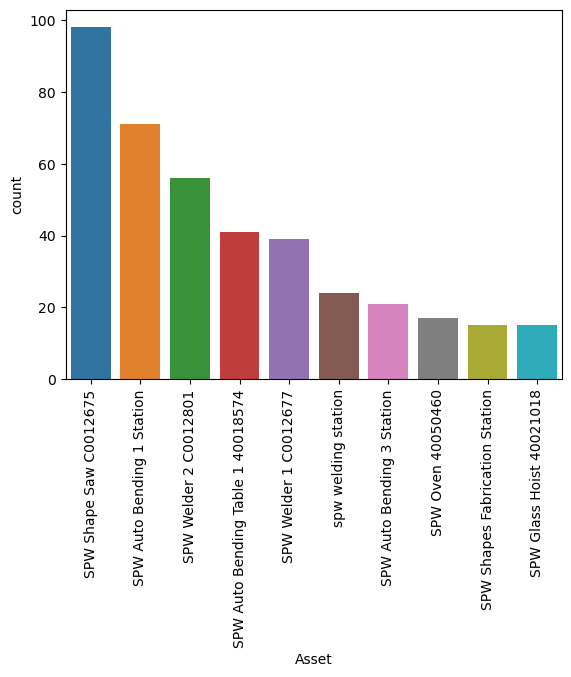

In [22]:
# Plot bar chart for top 10 asset with highest downtime by number of incidents
for line in enumerate(line_list):

    data_to_plot = z.where(z['Line'] == line[1]).dropna().groupby(by = 'Asset')[['Asset','Minutes','count']].sum().reset_index()
    data_to_plot.sort_values('count', ascending = False, inplace = True)
    
    ax = sns.barplot(data = data_to_plot.iloc[:10], x = 'Asset', y = 'count')
    ax.set_xticklabels(data_to_plot['Asset'].iloc[:10], rotation = 90)
    plt.show()
    

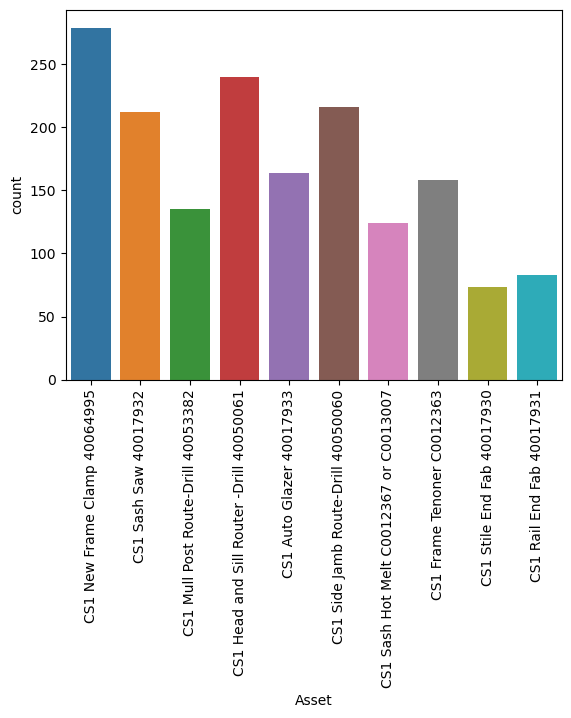

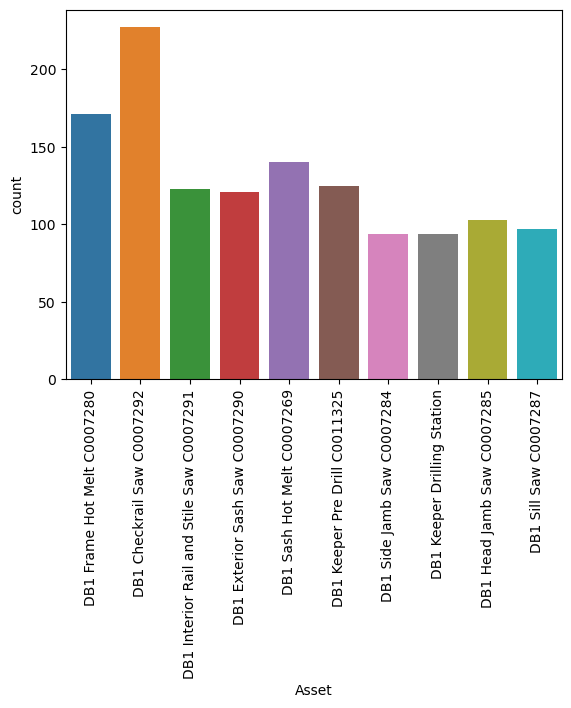

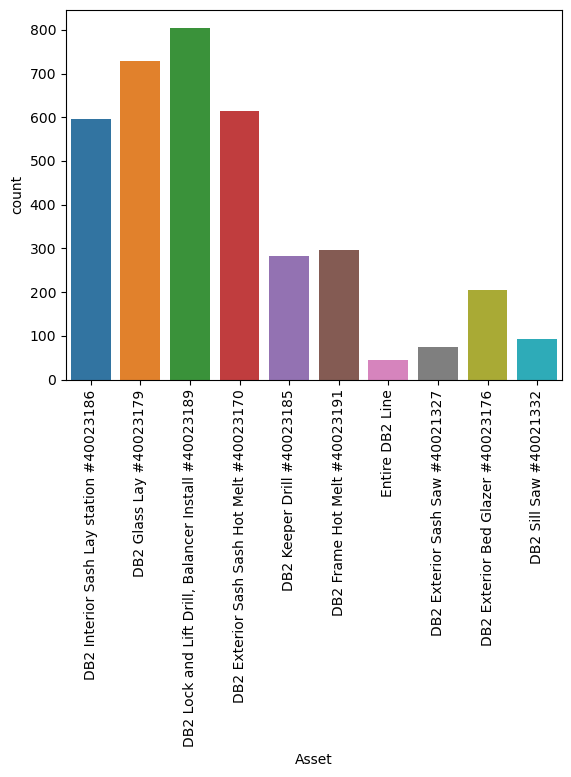

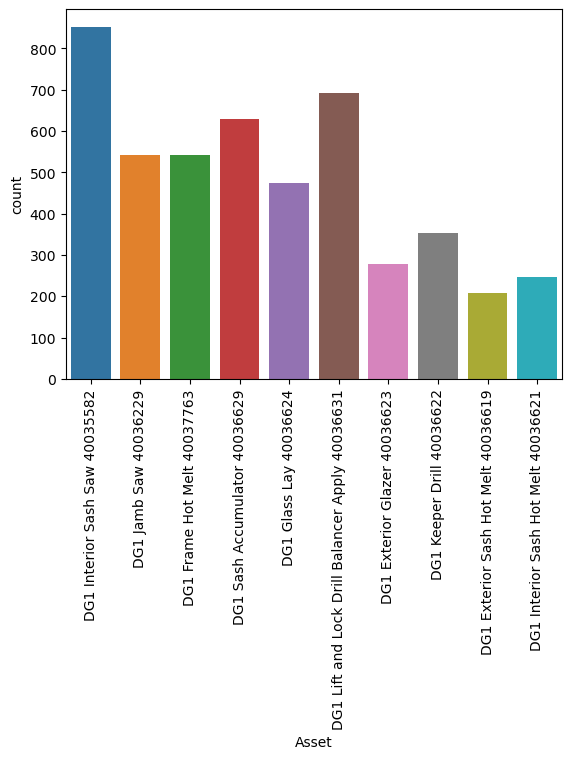

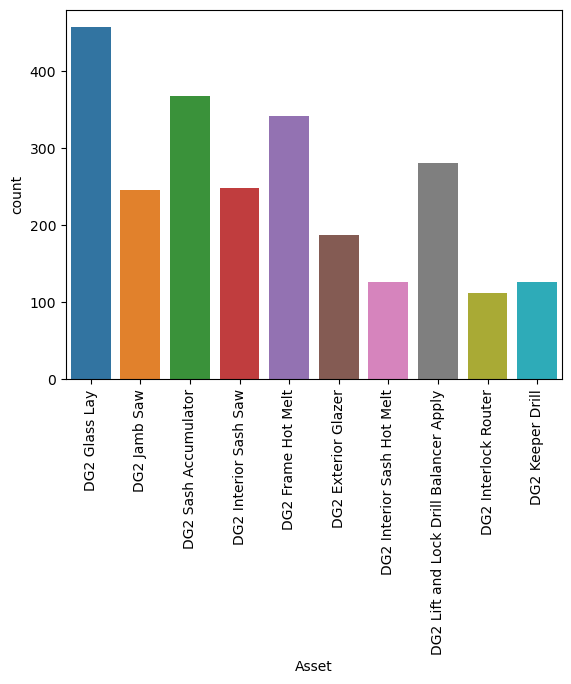

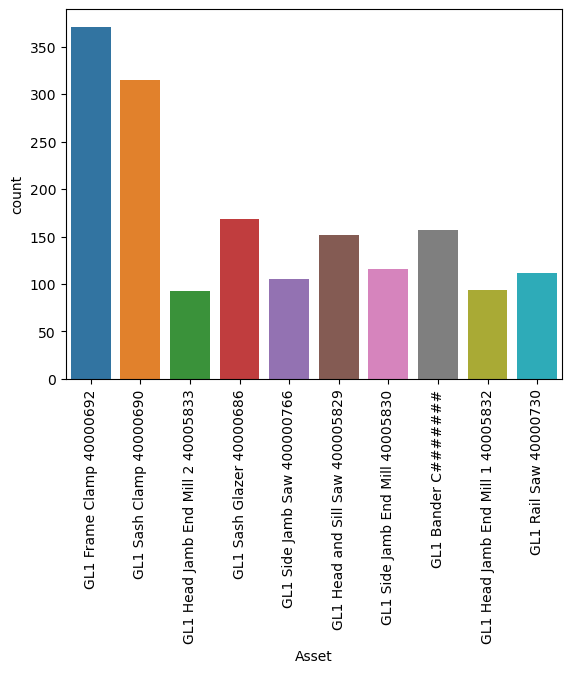

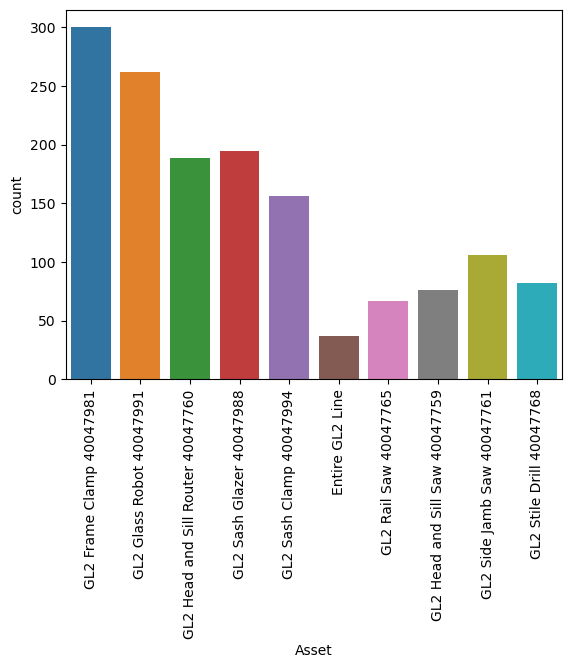

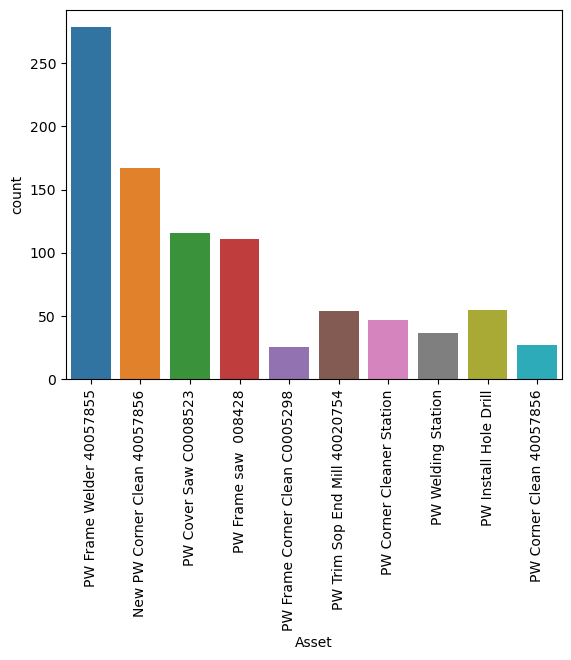

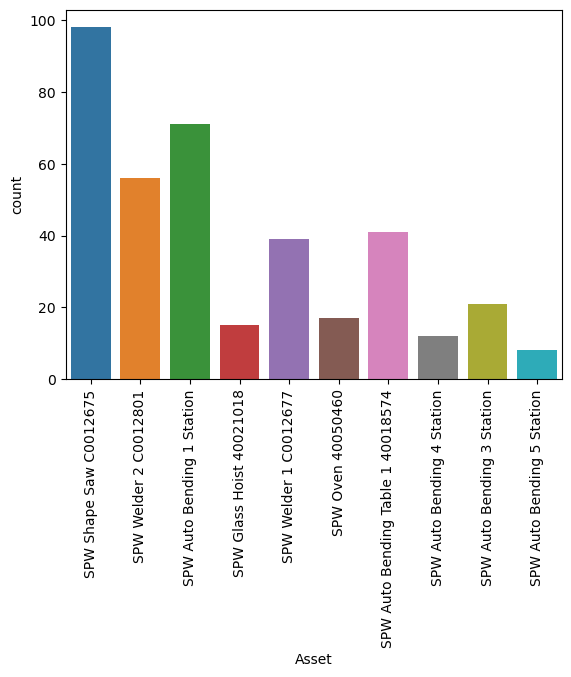

In [160]:
# Plot bar chart for top 10 asset with highest downtime by minutes 
for line in enumerate(line_list):

    data_to_plot = z.where(z['Line'] == line[1]).dropna().groupby(by = 'Asset')[['Asset','Minutes','count']].sum().reset_index()
    data_to_plot.sort_values('Minutes', ascending = False, inplace = True)
    
    ax = sns.barplot(data = data_to_plot.iloc[:10], x = 'Asset', y = 'count')
    ax.set_xticklabels(data_to_plot['Asset'].iloc[:10], rotation = 90)
    plt.show()

In [25]:
# function to plot trend line as adapted from Codio Solution

def extrapolate_trend(trend, npoints):
    """
    Replace nan values on trend's end-points with least-squares extrapolated
    values with regression considering npoints closest defined points.
    """
    front = next(i for i, vals in enumerate(trend)
                 if not np.any(np.isnan(vals)))
    back = trend.shape[0] - 1 - next(i for i, vals in enumerate(trend[::-1])
                                     if not np.any(np.isnan(vals)))
    front_last = min(front + npoints, back)
    back_first = max(front, back - npoints)

    k, n = np.linalg.lstsq(
        np.c_[np.arange(front, front_last), np.ones(front_last - front)],
        trend[front:front_last], rcond=-1)[0]
    extra = (np.arange(0, front) * np.c_[k] + np.c_[n]).T
    if trend.ndim == 1:
        extra = extra.squeeze()
    trend[:front] = extra

    k, n = np.linalg.lstsq(
        np.c_[np.arange(back_first, back), np.ones(back - back_first)],
        trend[back_first:back], rcond=-1)[0]
    extra = (np.arange(back + 1, trend.shape[0]) * np.c_[k] + np.c_[n]).T
    if trend.ndim == 1:
        extra = extra.squeeze()
    trend[back + 1:] = extra

    return trend

['CS1 New Frame Clamp 40064995', 'CS1 Head and Sill Router -Drill 40050061', 'CS1 Side Jamb Route-Drill 40050060']


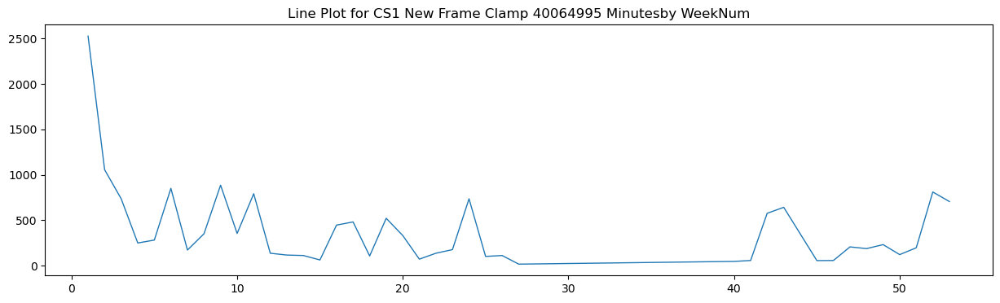

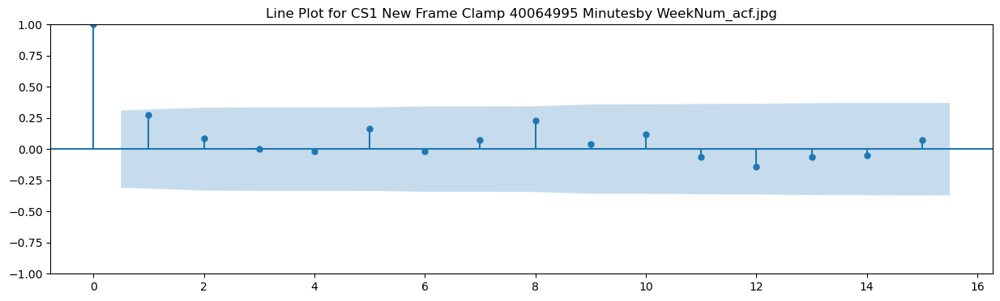

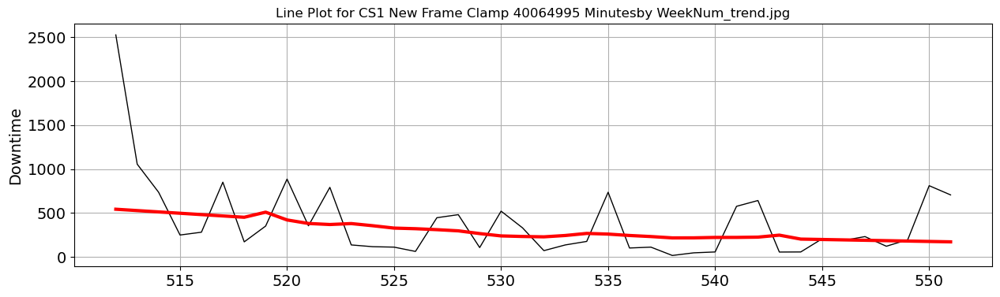

ADF Test Statistic: -4.98
5% Critical Value: -2.94
p-value: 0.00


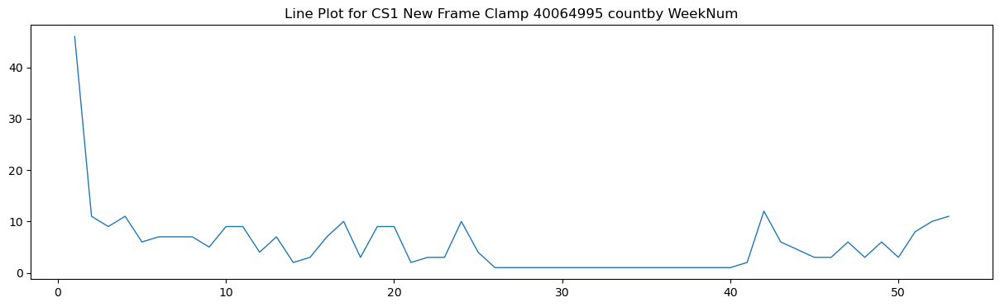

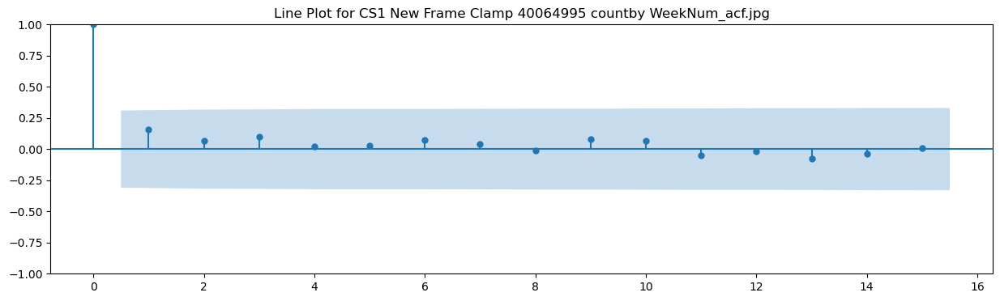

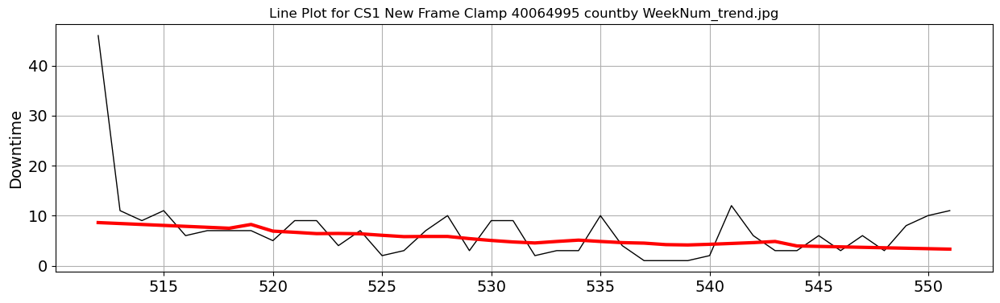

ADF Test Statistic: -11.84
5% Critical Value: -2.94
p-value: 0.00


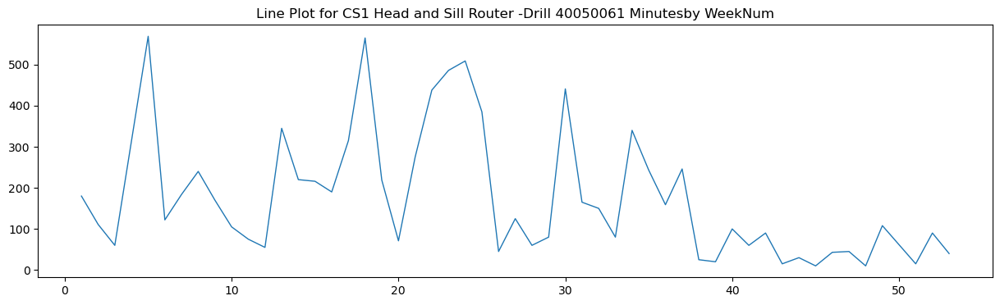

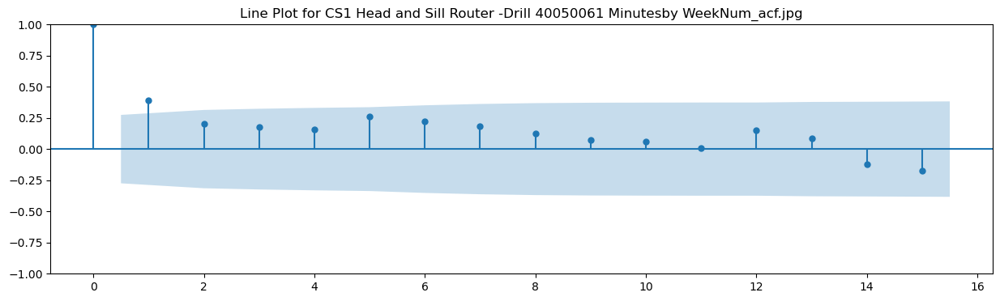

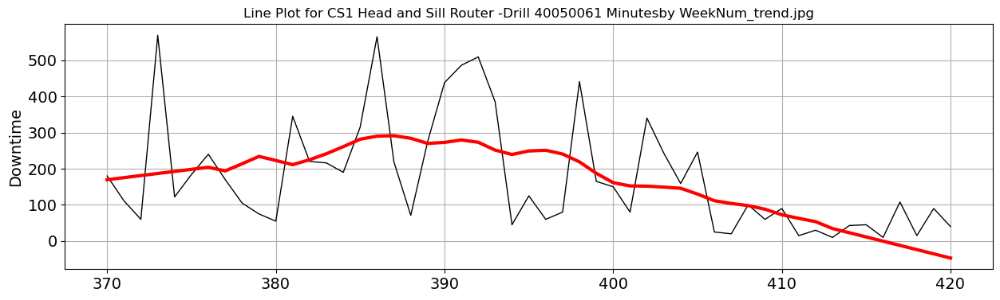

ADF Test Statistic: -4.49
5% Critical Value: -2.92
p-value: 0.00


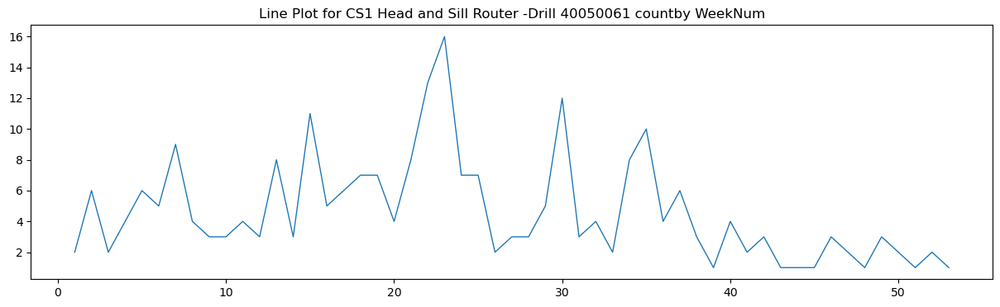

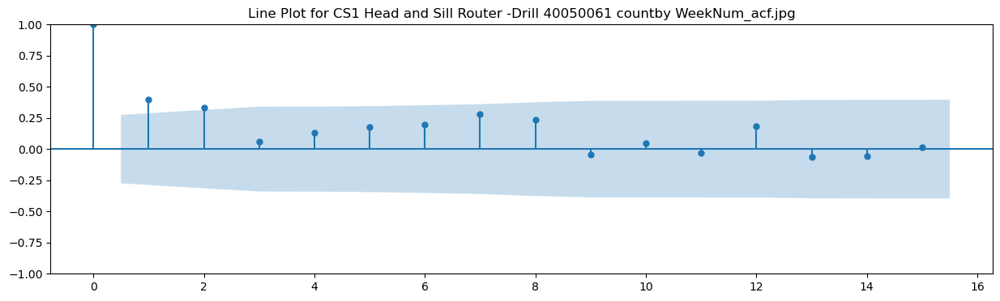

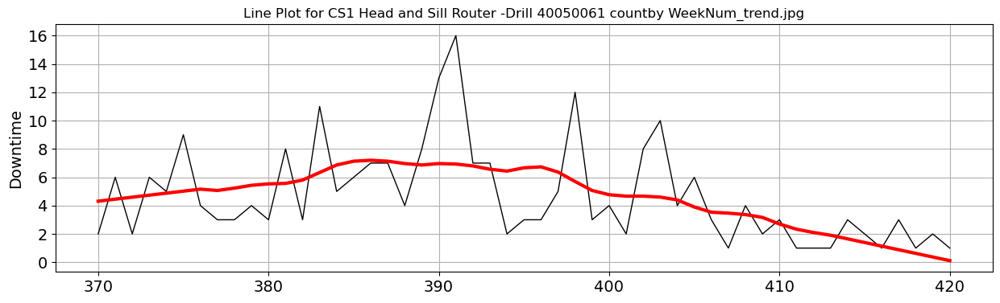

ADF Test Statistic: -4.47
5% Critical Value: -2.92
p-value: 0.00


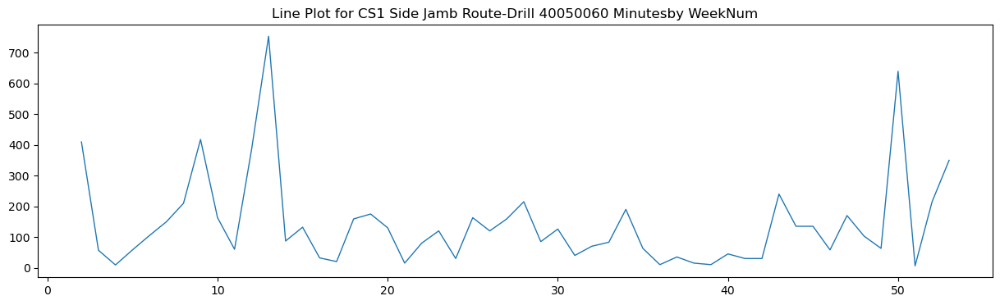

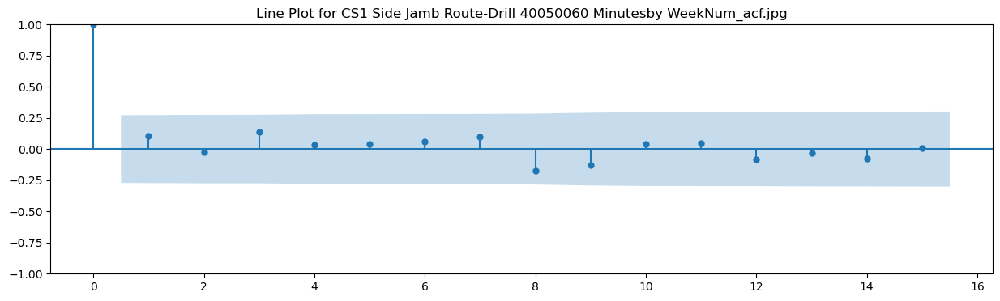

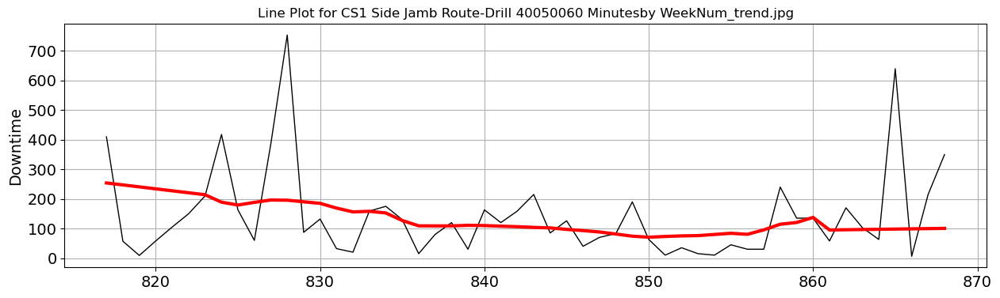

ADF Test Statistic: -6.34
5% Critical Value: -2.92
p-value: 0.00


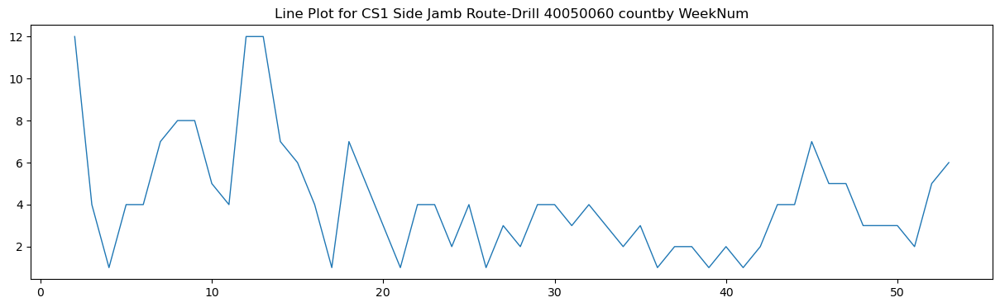

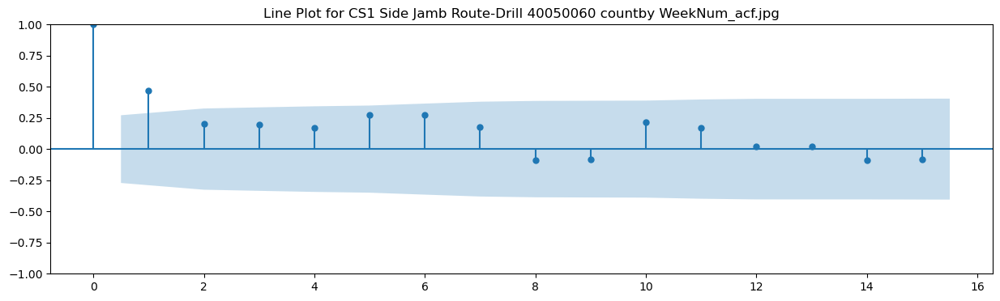

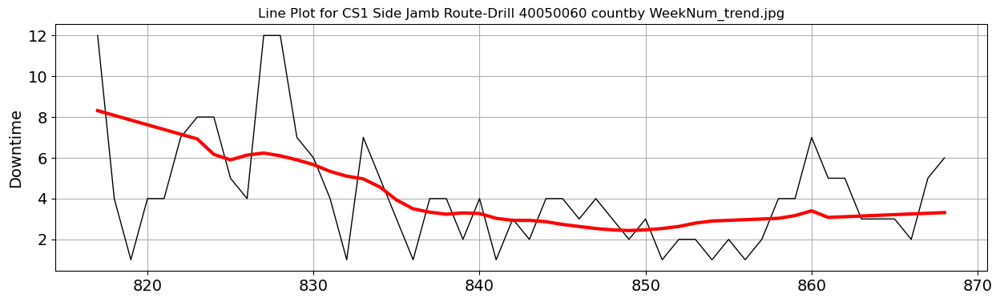

ADF Test Statistic: -4.71
5% Critical Value: -2.92
p-value: 0.00
['DB1 Checkrail Saw C0007292', 'DB1 Frame Hot Melt C0007280', 'DB1 Sash Hot Melt C0007269']


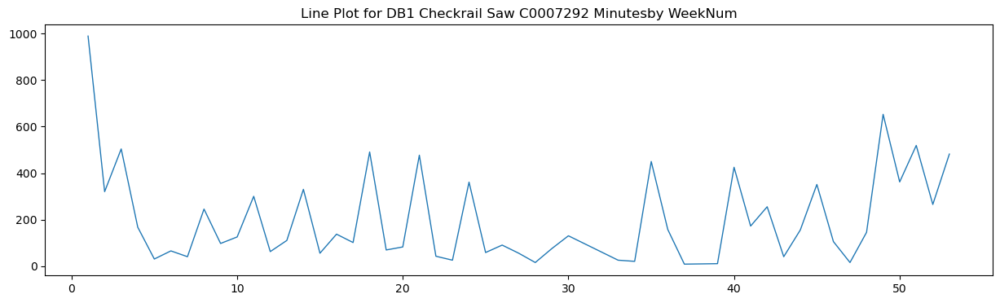

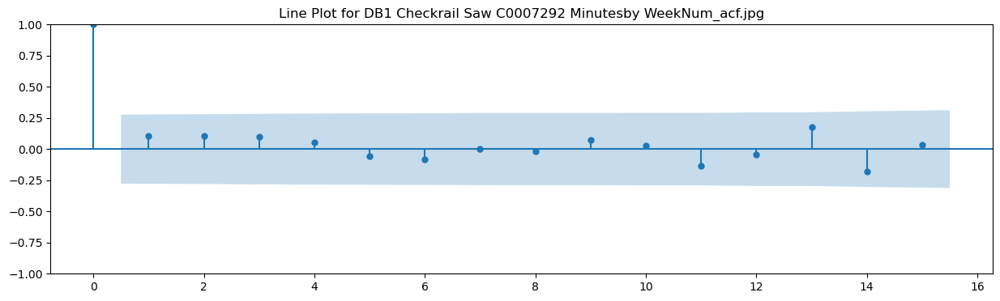

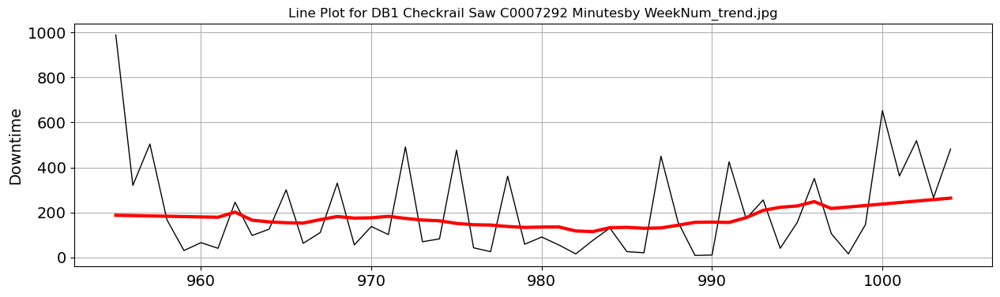

ADF Test Statistic: -7.27
5% Critical Value: -2.92
p-value: 0.00


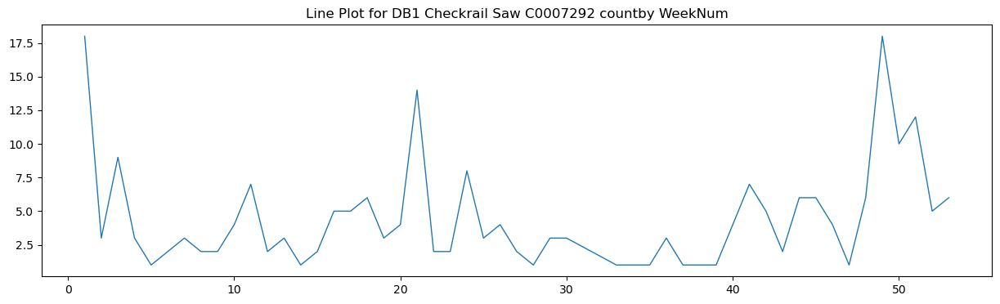

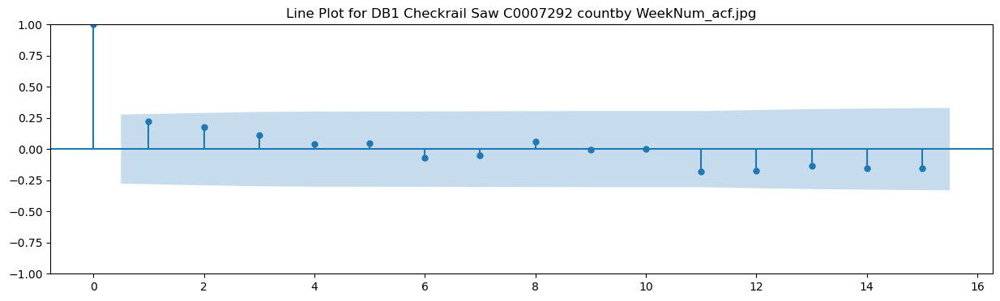

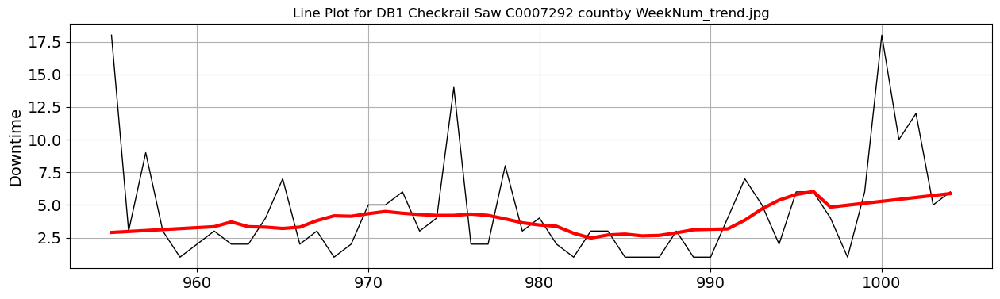

ADF Test Statistic: -6.30
5% Critical Value: -2.92
p-value: 0.00


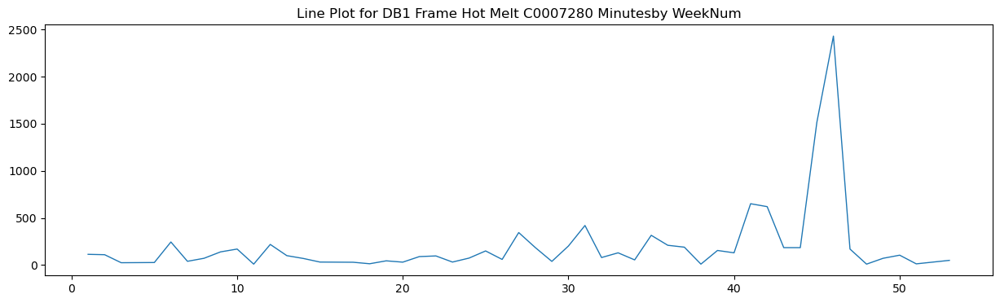

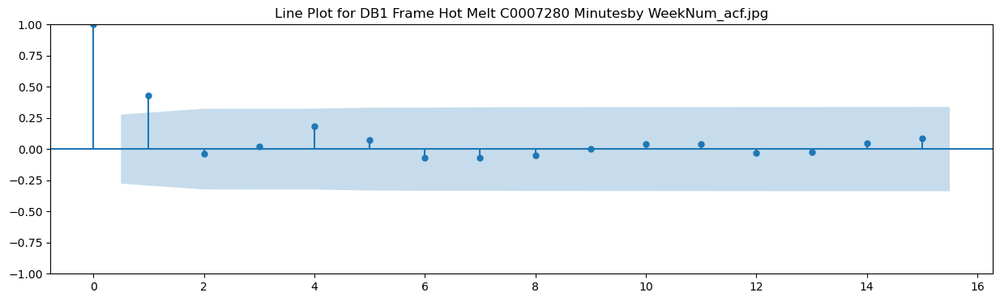

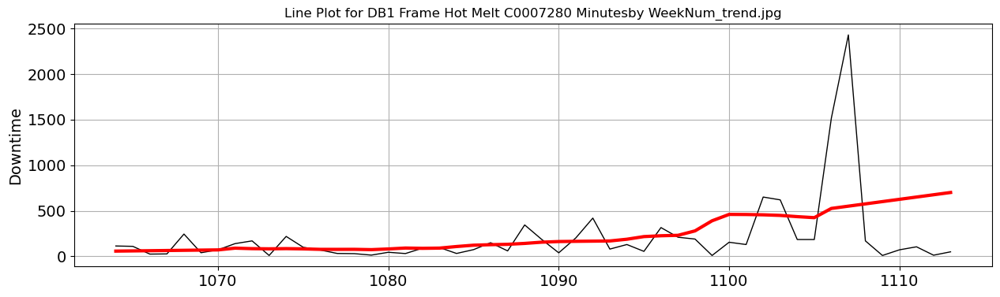

ADF Test Statistic: 0.66
5% Critical Value: -2.94
p-value: 0.99


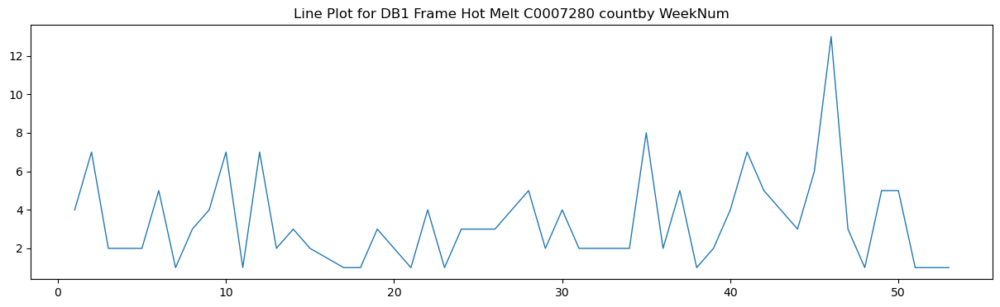

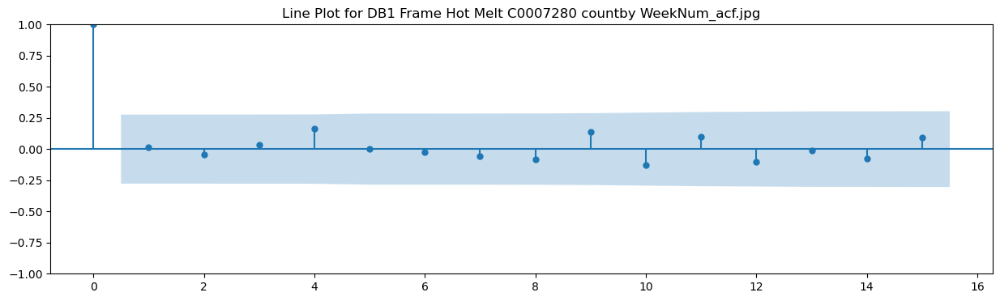

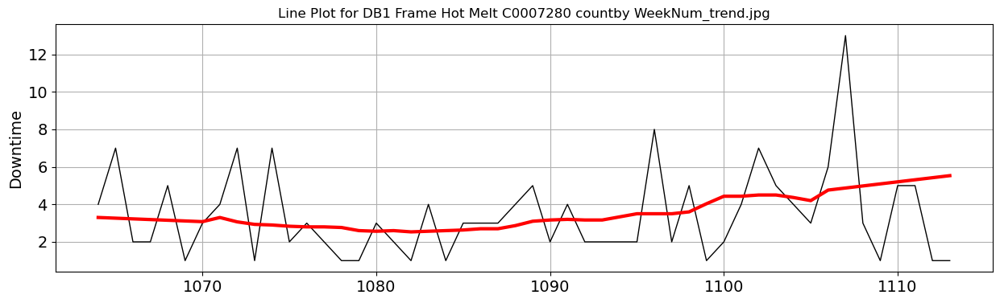

ADF Test Statistic: -6.69
5% Critical Value: -2.92
p-value: 0.00


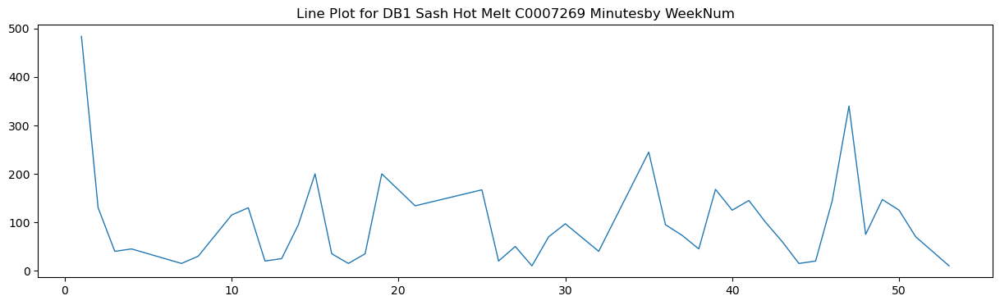

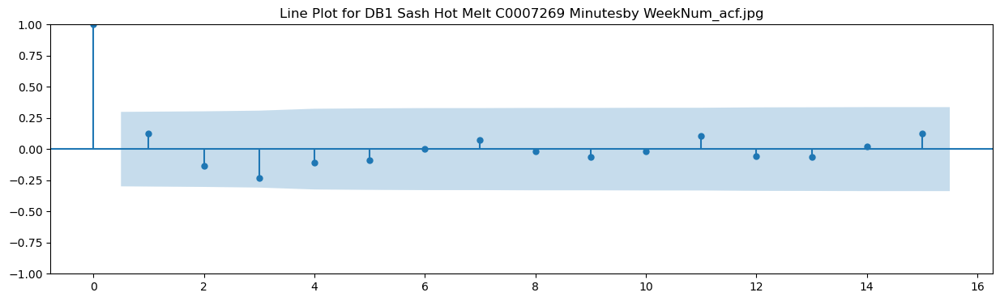

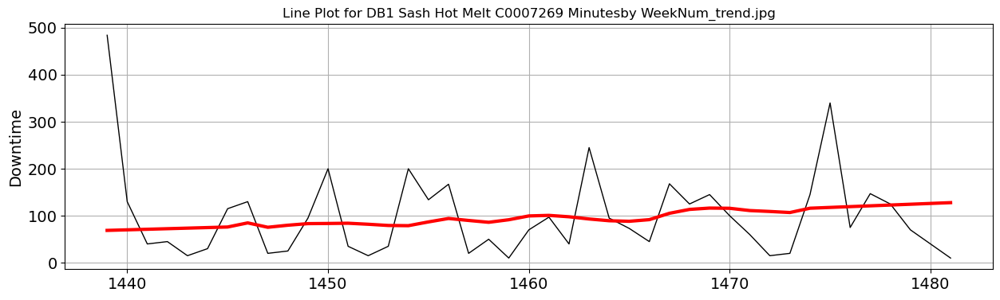

ADF Test Statistic: -4.85
5% Critical Value: -2.94
p-value: 0.00


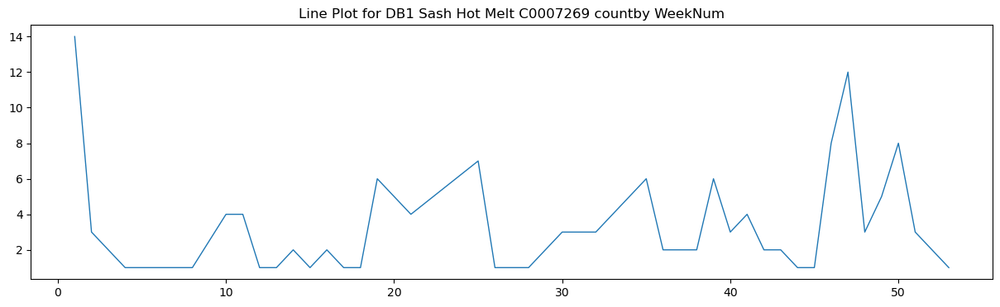

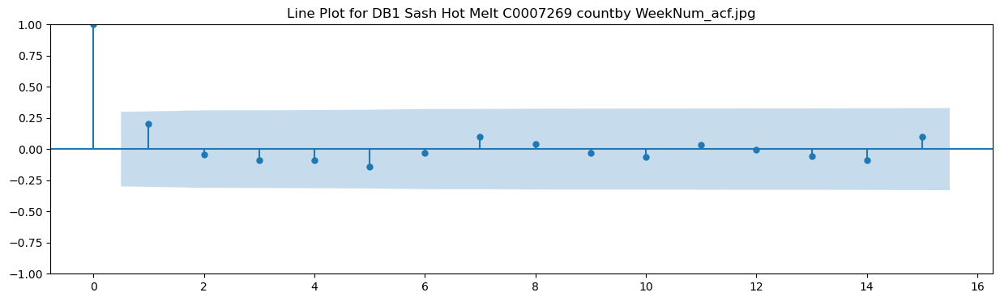

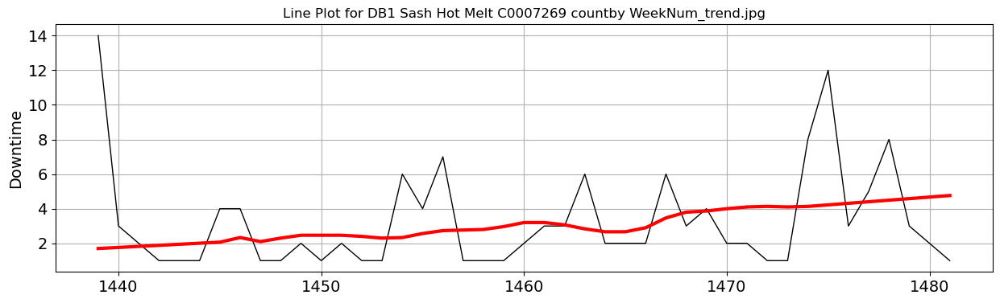

ADF Test Statistic: -6.24
5% Critical Value: -2.93
p-value: 0.00
['DB2 Lock and Lift Drill, Balancer Install #40023189', 'DB2 Glass Lay #40023179', 'DB2 Exterior Sash Sash Hot Melt #40023170']


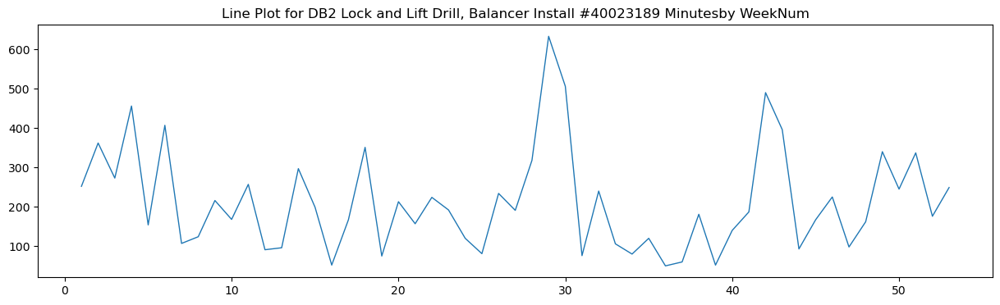

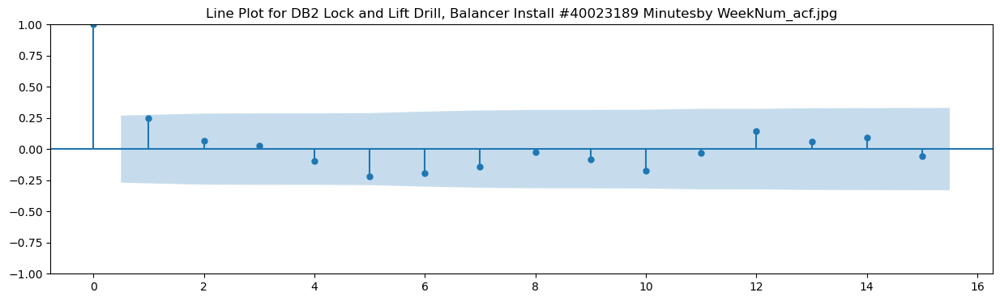

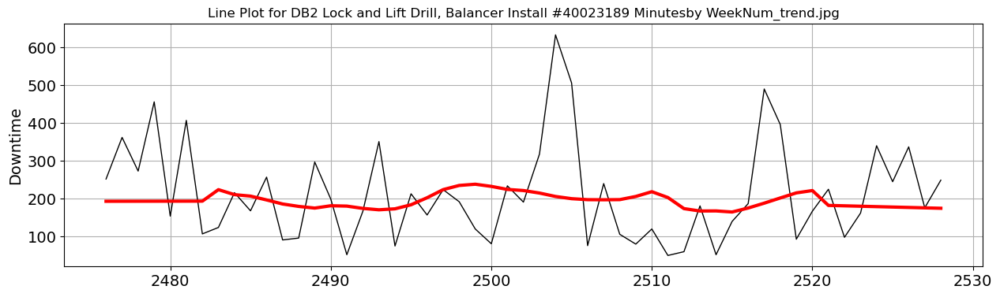

ADF Test Statistic: -5.48
5% Critical Value: -2.92
p-value: 0.00


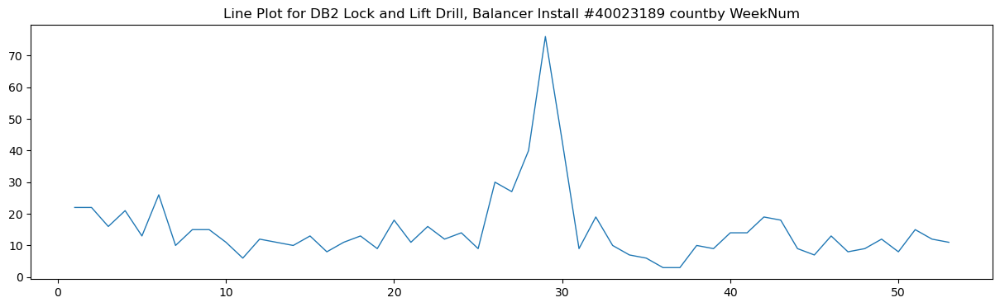

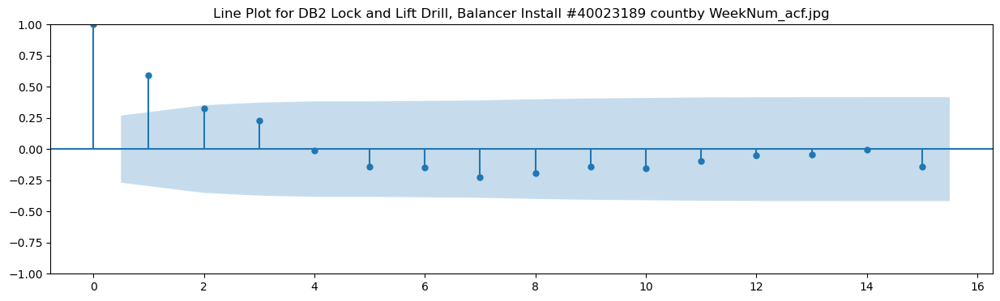

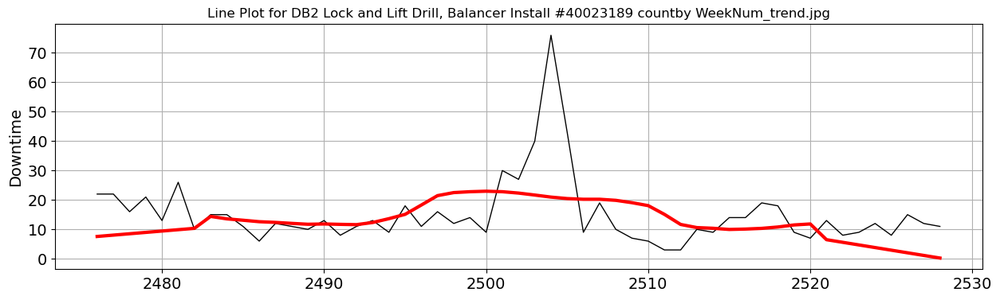

ADF Test Statistic: -3.57
5% Critical Value: -2.92
p-value: 0.01


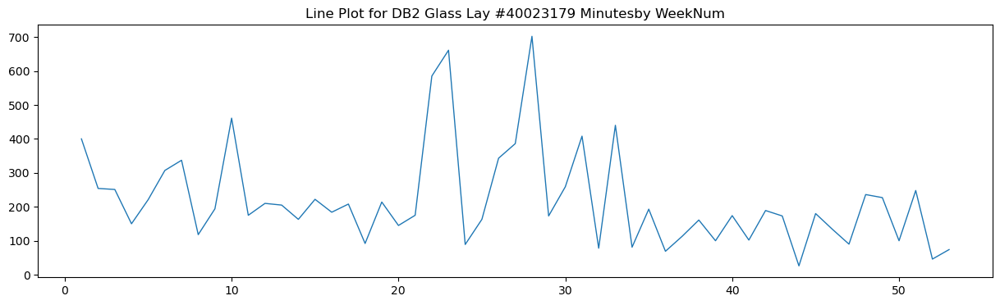

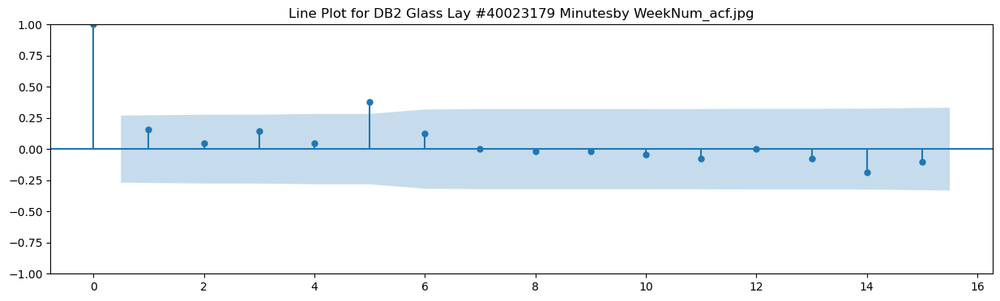

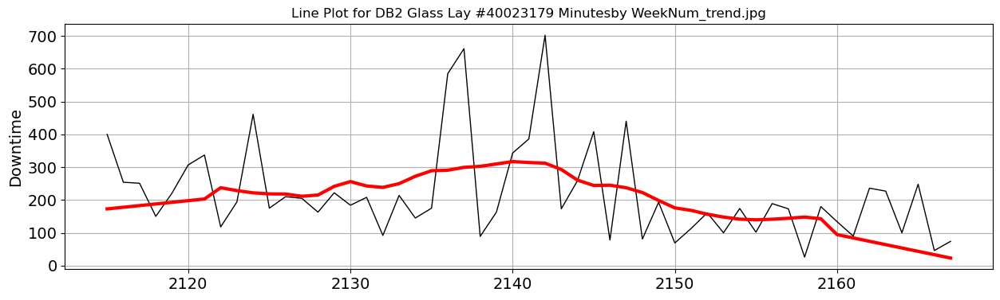

ADF Test Statistic: -1.46
5% Critical Value: -2.92
p-value: 0.55


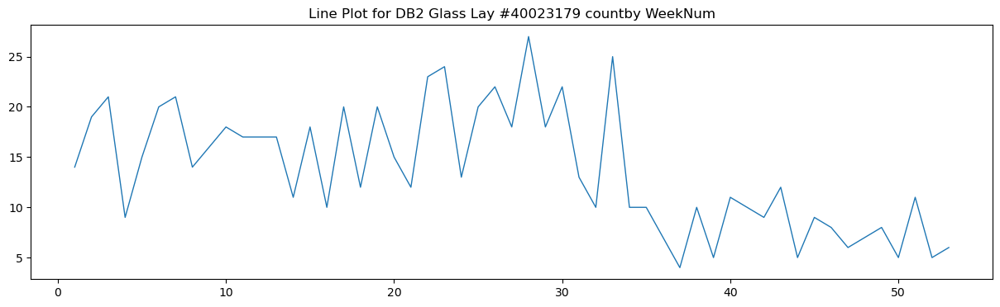

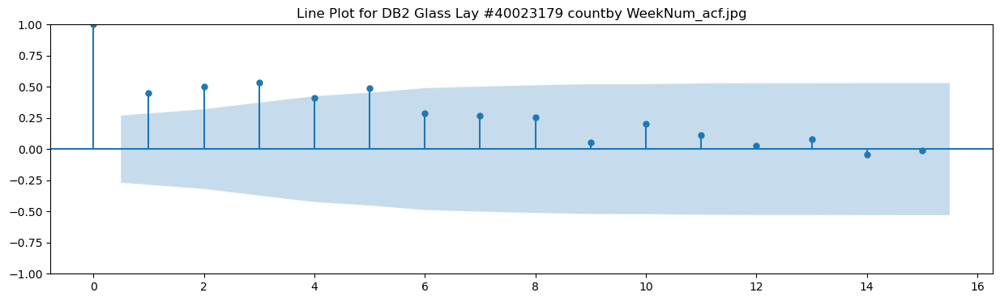

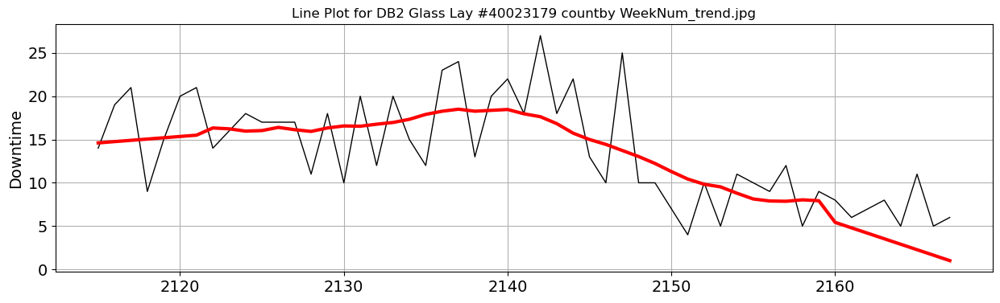

ADF Test Statistic: -1.27
5% Critical Value: -2.92
p-value: 0.64


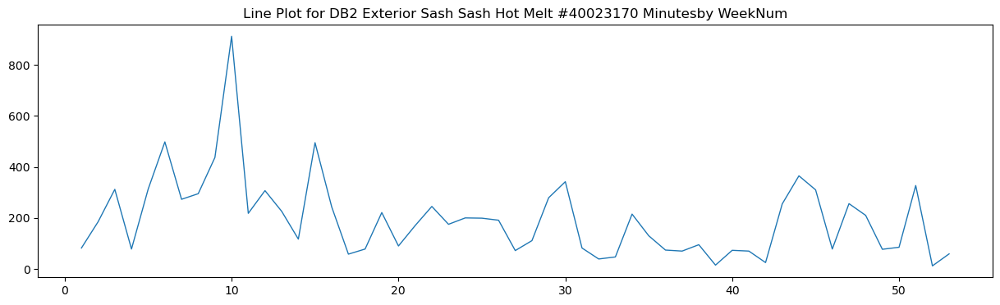

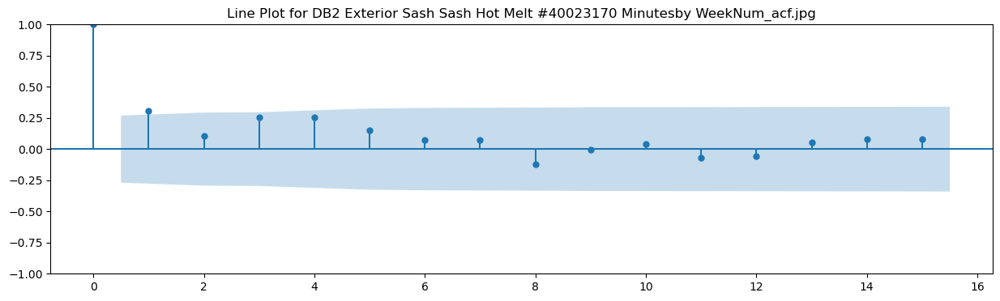

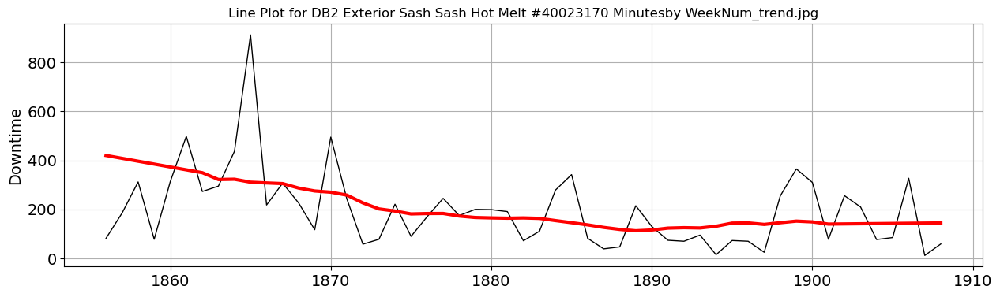

ADF Test Statistic: -5.12
5% Critical Value: -2.92
p-value: 0.00


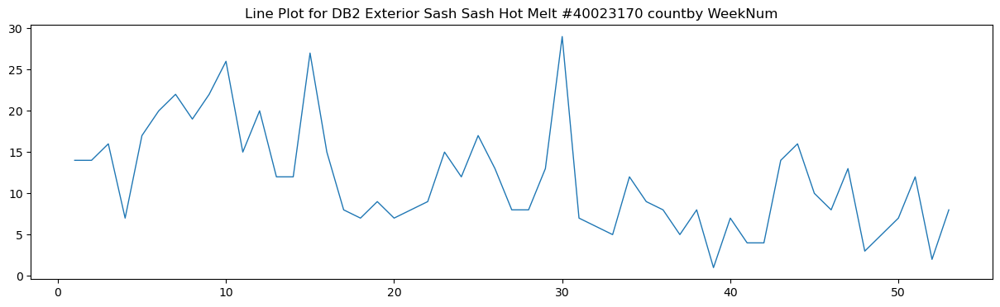

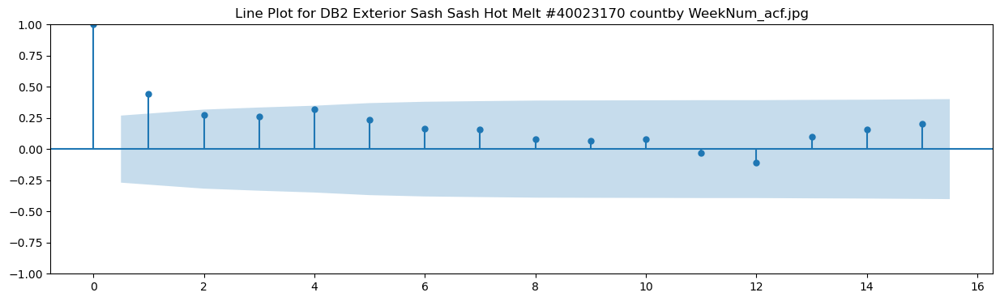

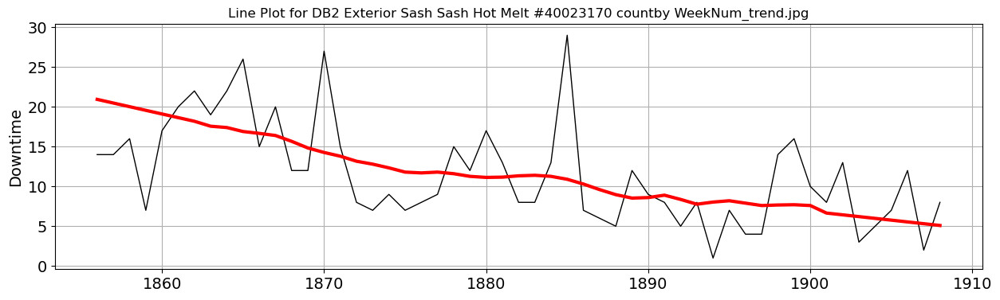

ADF Test Statistic: -4.38
5% Critical Value: -2.92
p-value: 0.00
['DG1 Interior Sash Saw 40035582', 'DG1 Lift and Lock Drill Balancer Apply 40036631', 'DG1 Sash Accumulator 40036629']


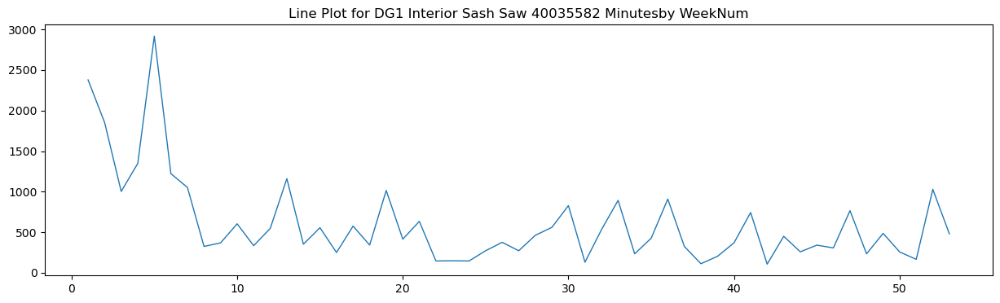

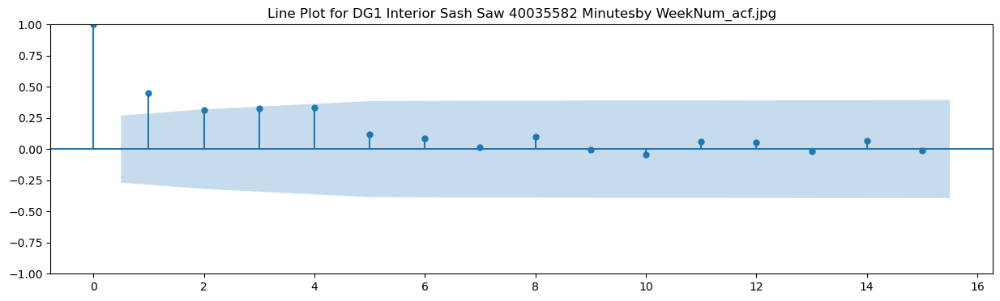

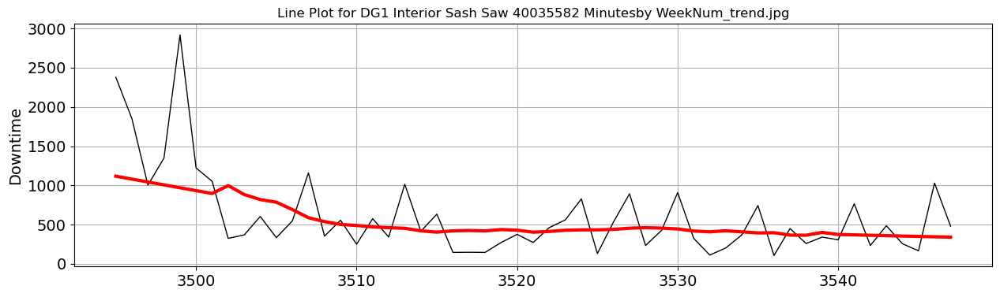

ADF Test Statistic: -5.03
5% Critical Value: -2.92
p-value: 0.00


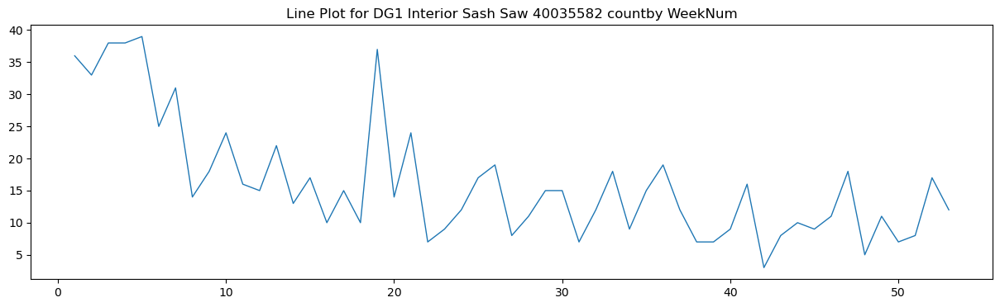

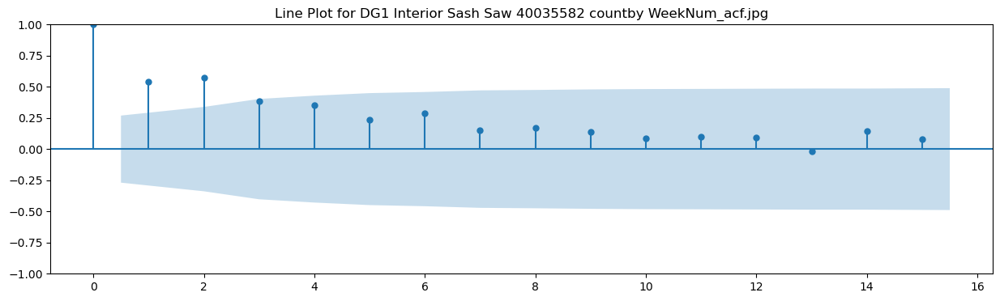

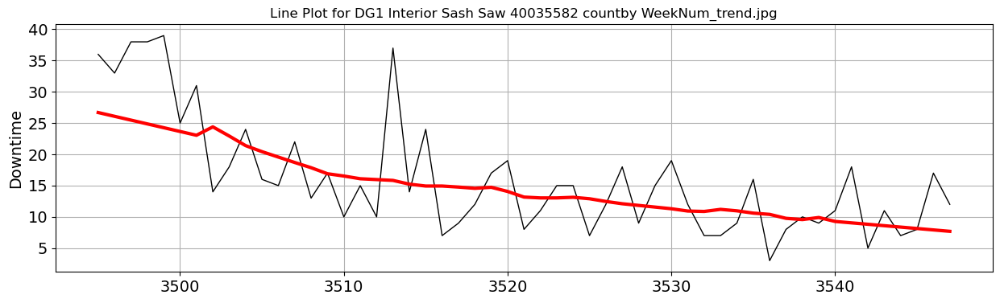

ADF Test Statistic: -4.12
5% Critical Value: -2.92
p-value: 0.00


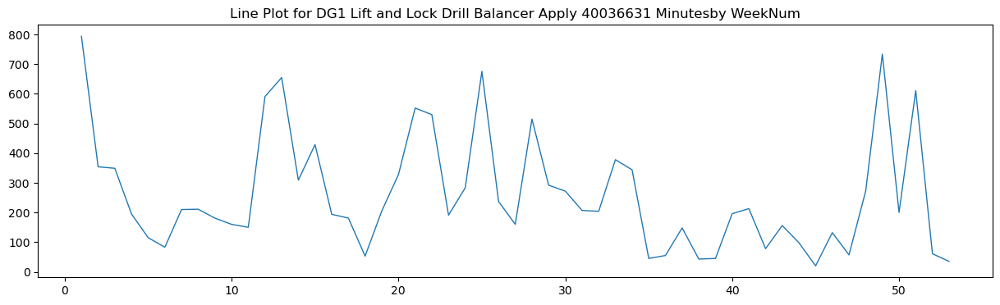

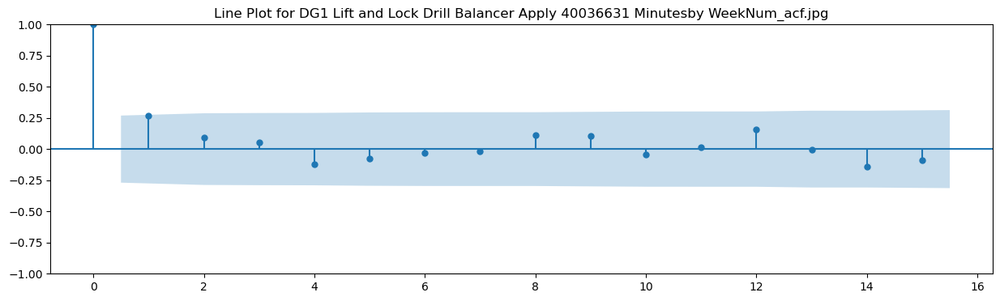

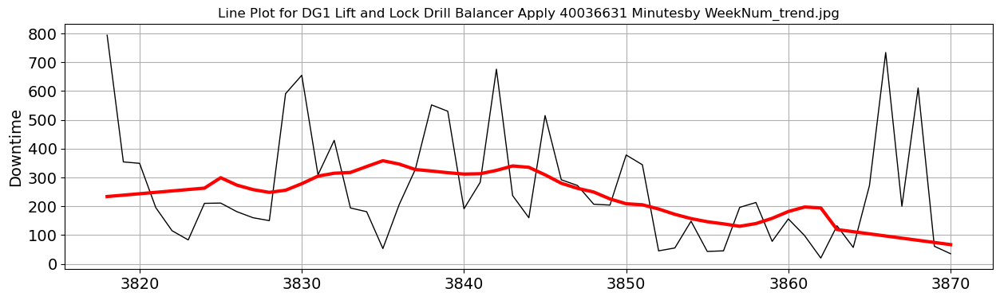

ADF Test Statistic: -5.73
5% Critical Value: -2.92
p-value: 0.00


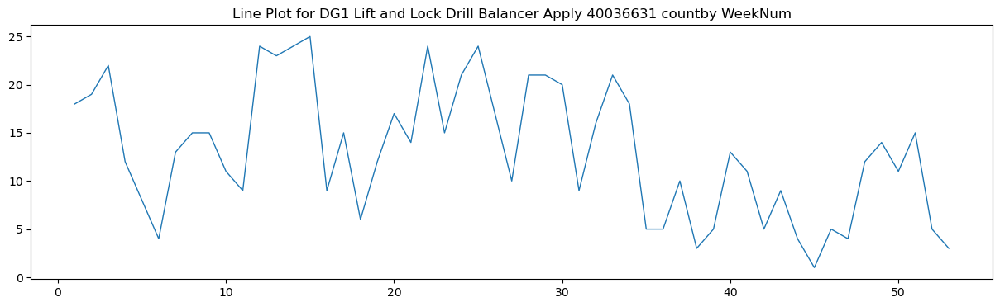

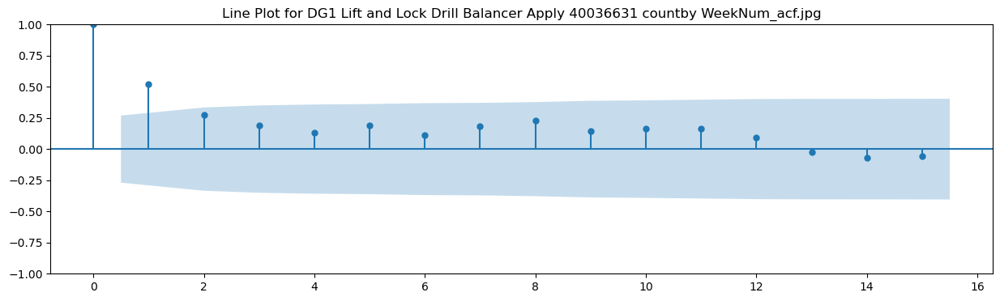

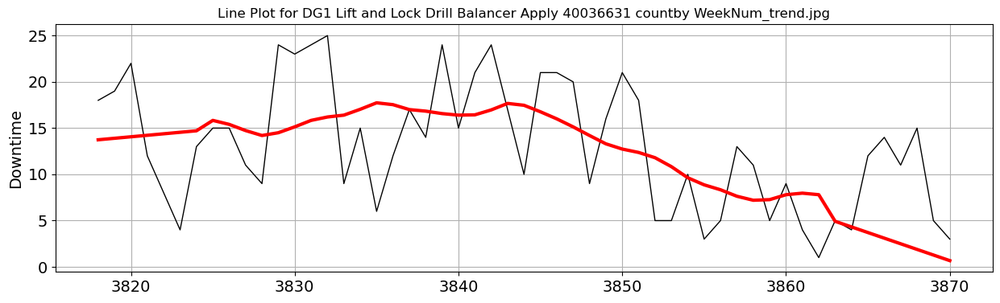

ADF Test Statistic: -3.75
5% Critical Value: -2.92
p-value: 0.00


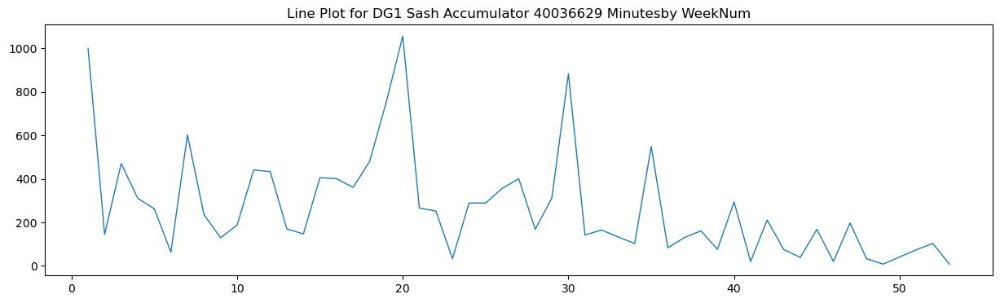

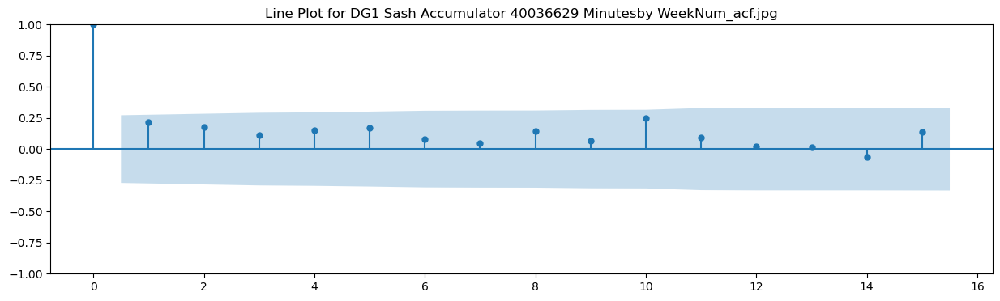

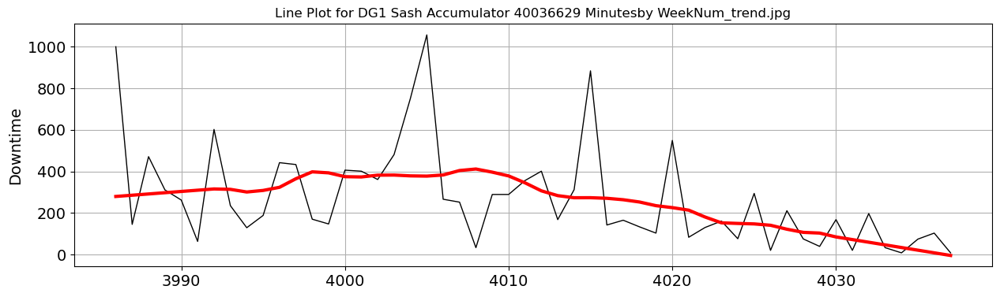

ADF Test Statistic: -6.14
5% Critical Value: -2.92
p-value: 0.00


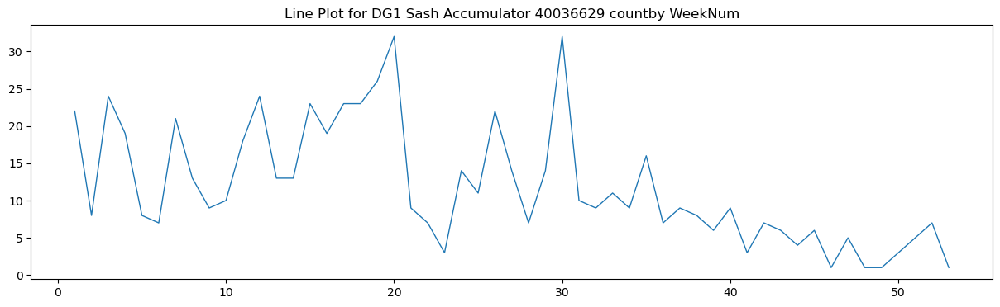

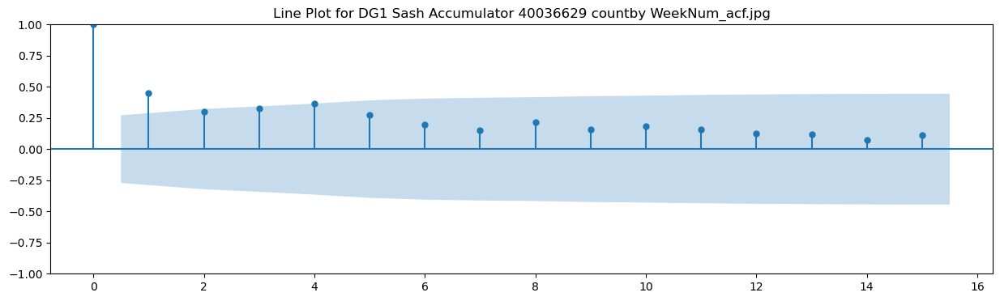

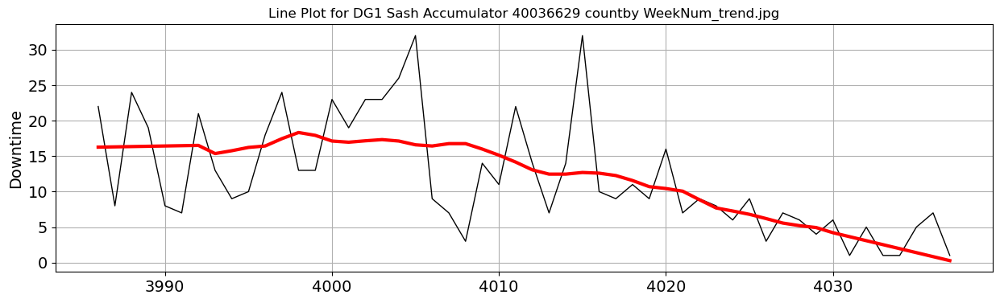

ADF Test Statistic: -4.19
5% Critical Value: -2.92
p-value: 0.00
['DG2 Glass Lay', 'DG2 Sash Accumulator', 'DG2 Frame Hot Melt']


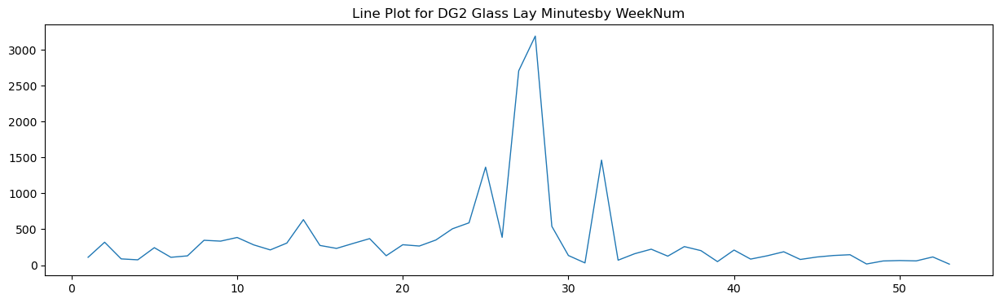

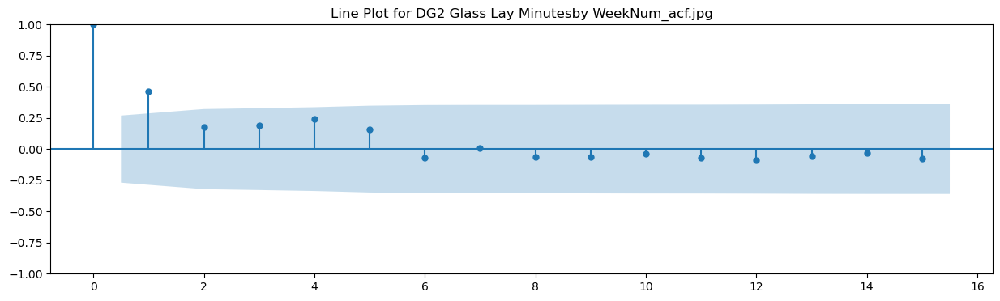

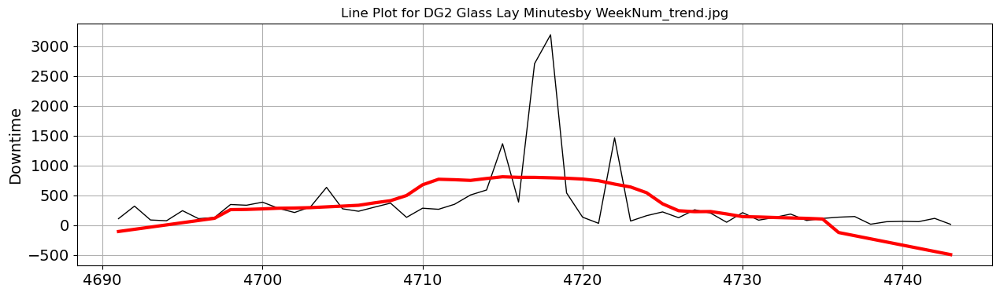

ADF Test Statistic: -4.27
5% Critical Value: -2.92
p-value: 0.00


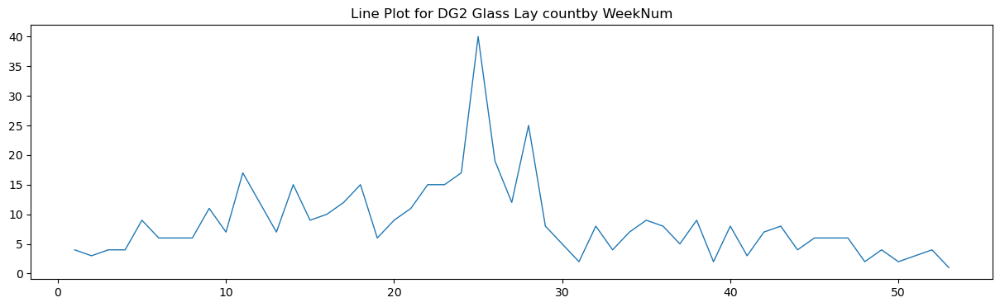

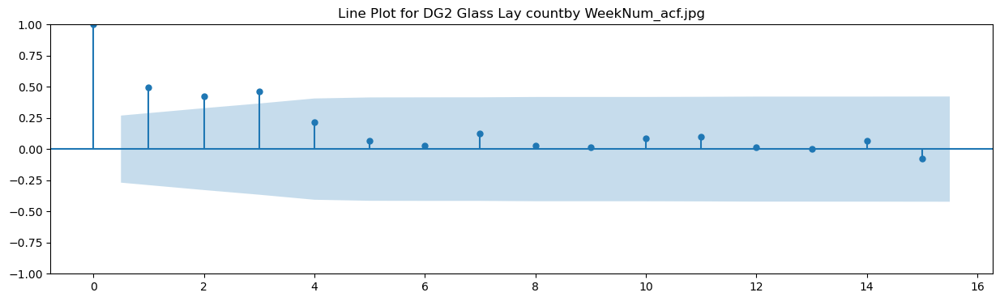

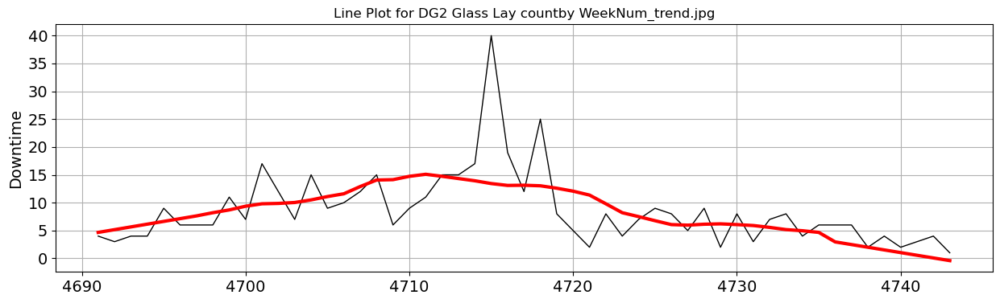

ADF Test Statistic: -1.49
5% Critical Value: -2.93
p-value: 0.54


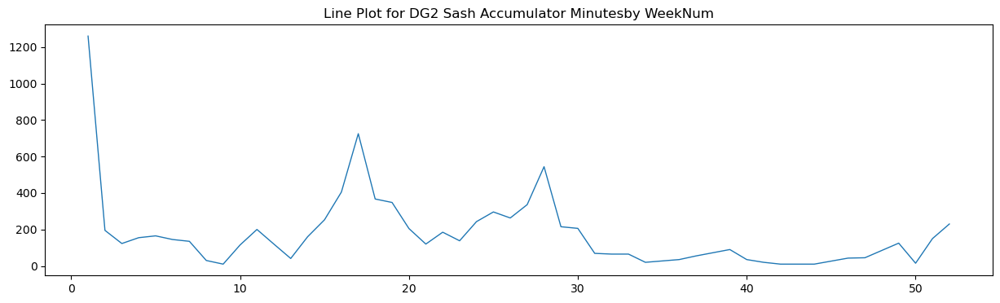

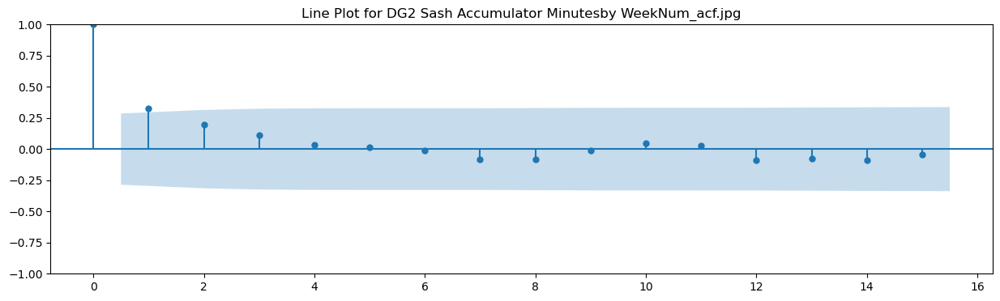

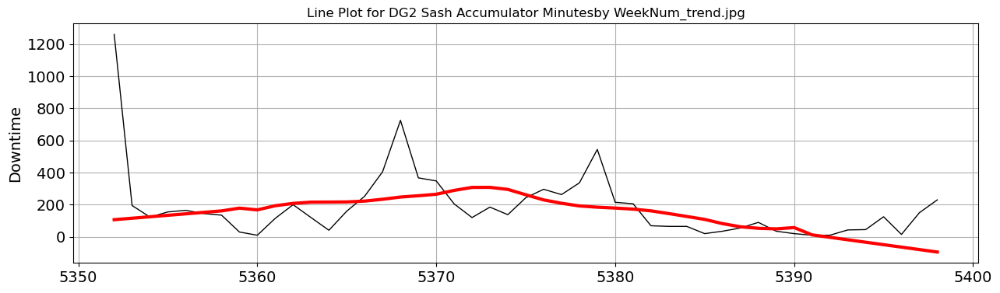

ADF Test Statistic: -7.62
5% Critical Value: -2.93
p-value: 0.00


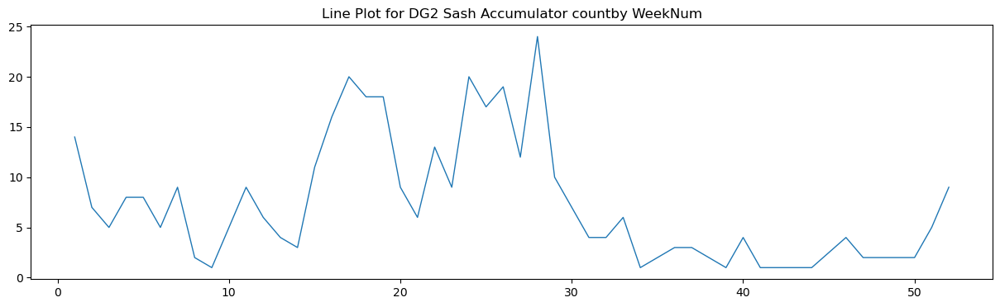

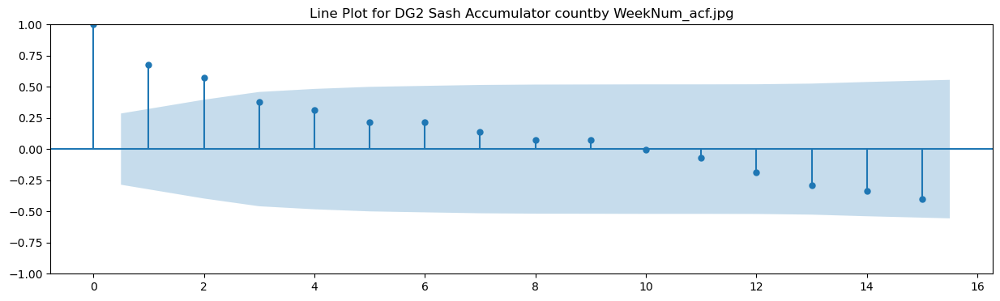

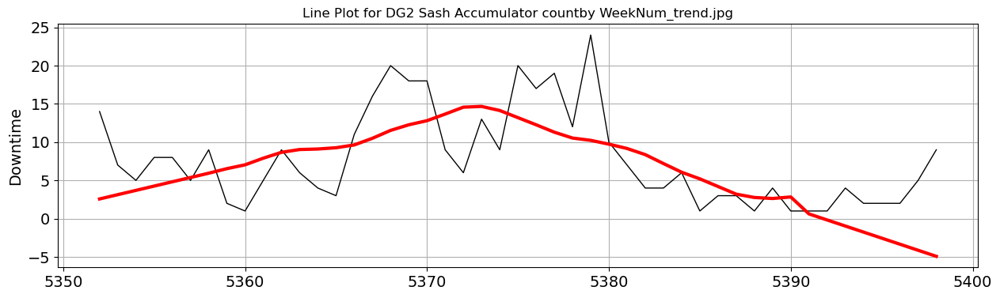

ADF Test Statistic: -2.96
5% Critical Value: -2.93
p-value: 0.04


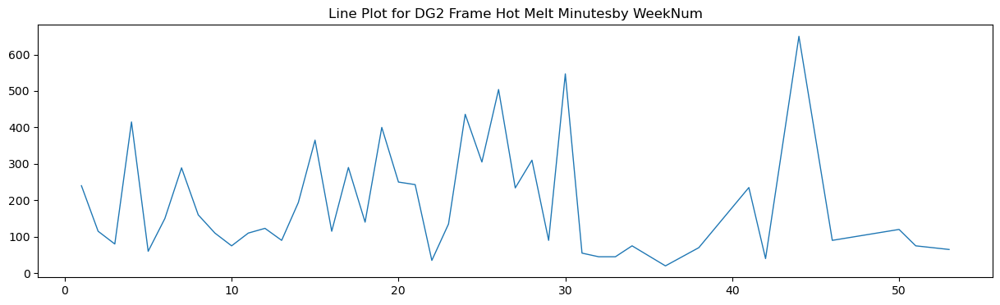

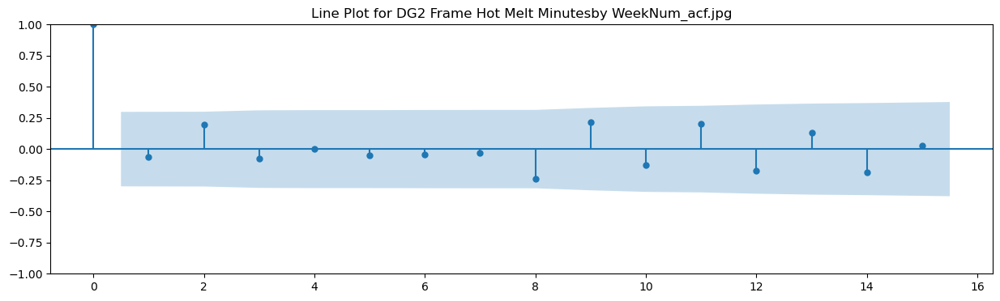

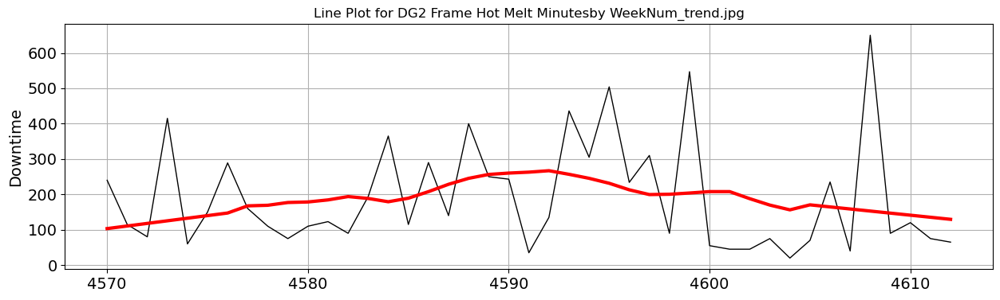

ADF Test Statistic: -3.59
5% Critical Value: -2.94
p-value: 0.01


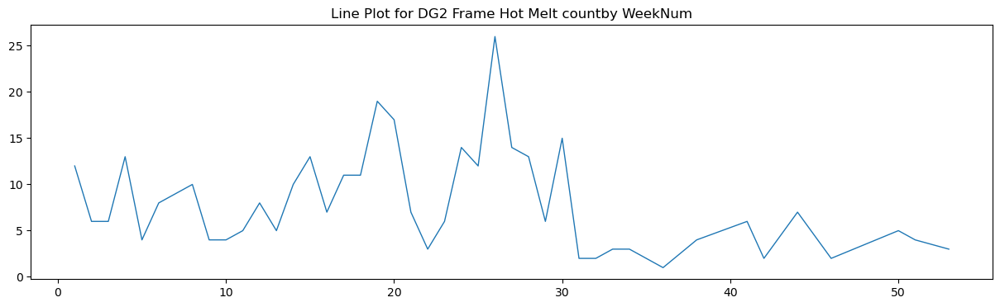

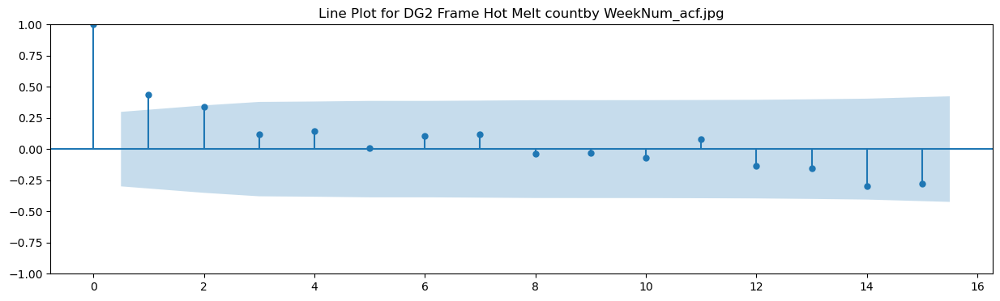

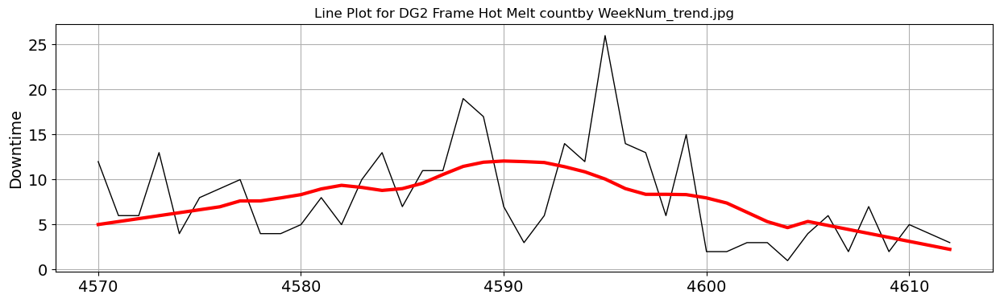

ADF Test Statistic: -3.91
5% Critical Value: -2.93
p-value: 0.00
['GL1 Frame Clamp 40000692', 'GL1 Sash Clamp 40000690', 'GL1 Sash Glazer 40000686']


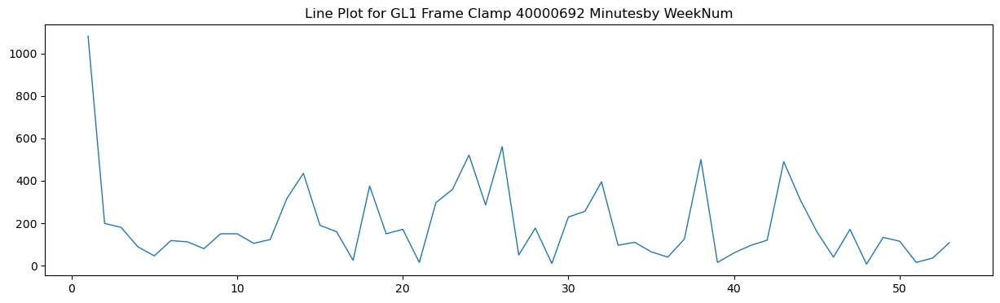

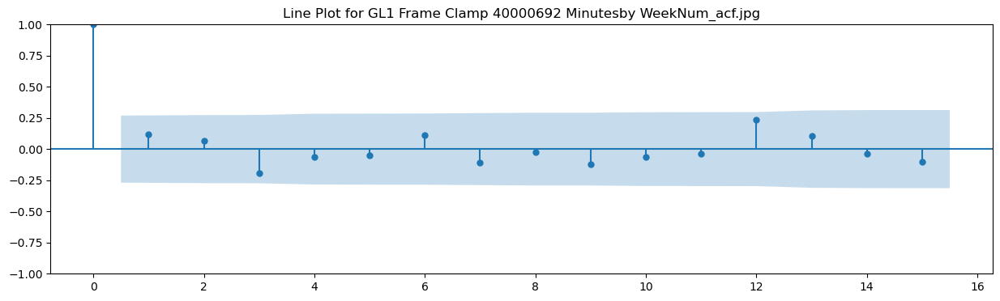

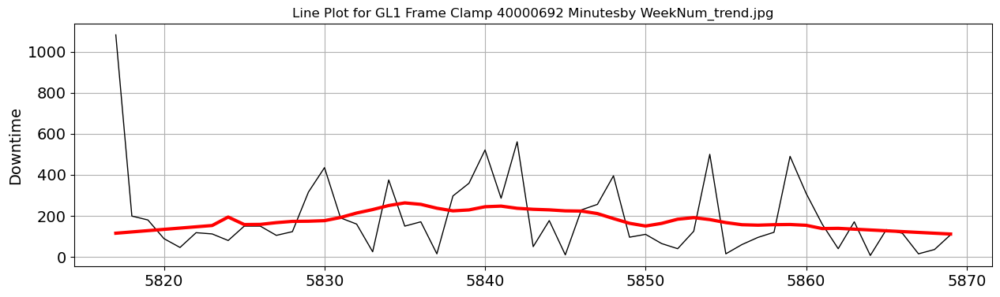

ADF Test Statistic: -4.59
5% Critical Value: -2.92
p-value: 0.00


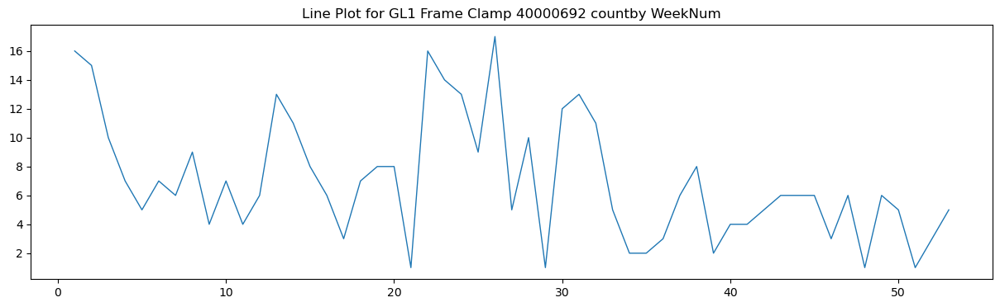

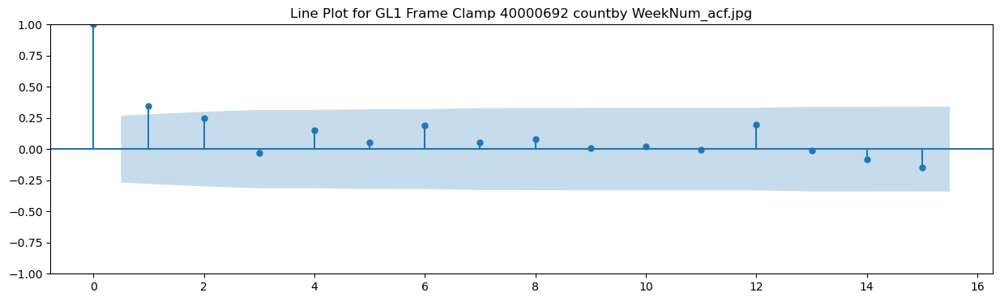

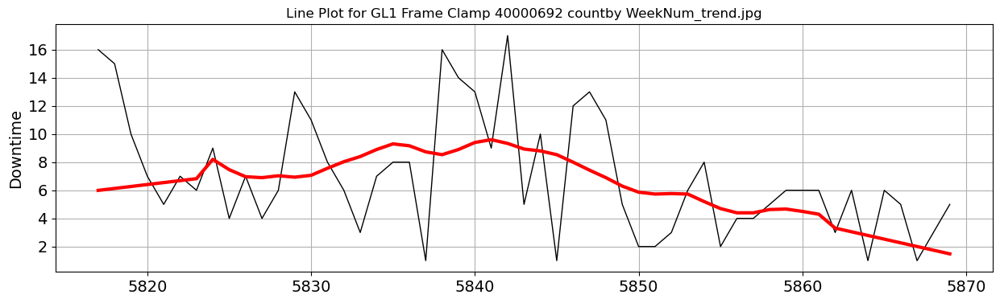

ADF Test Statistic: -5.18
5% Critical Value: -2.92
p-value: 0.00


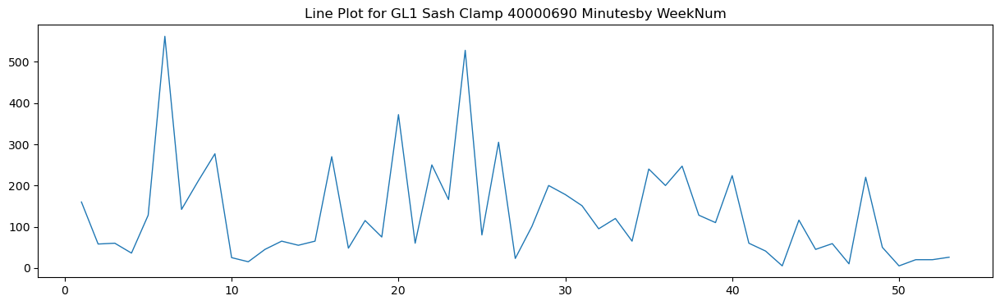

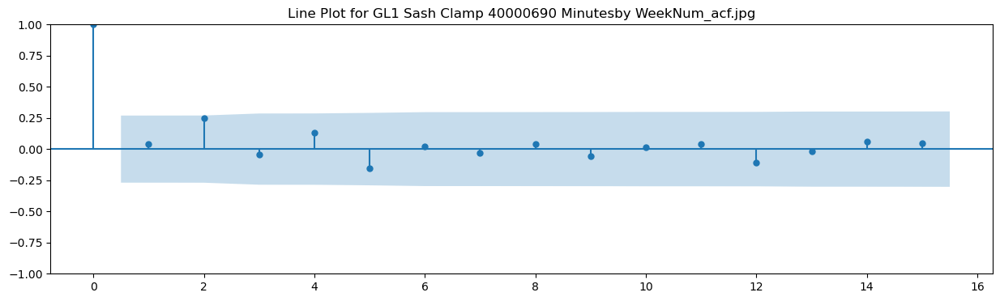

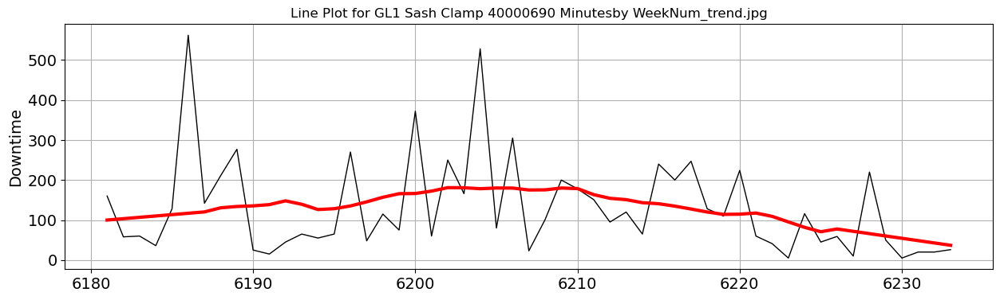

ADF Test Statistic: -2.60
5% Critical Value: -2.92
p-value: 0.09


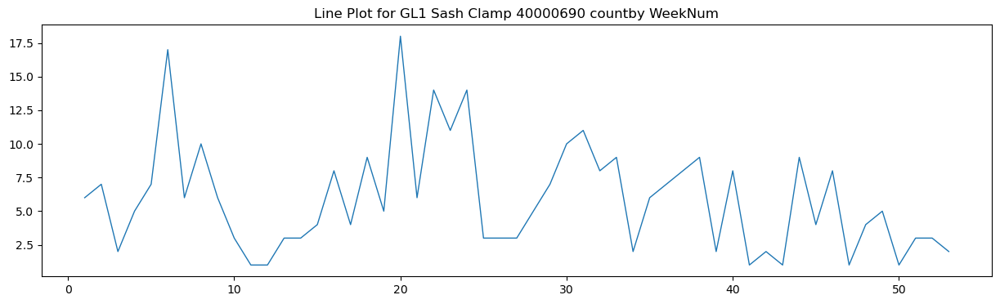

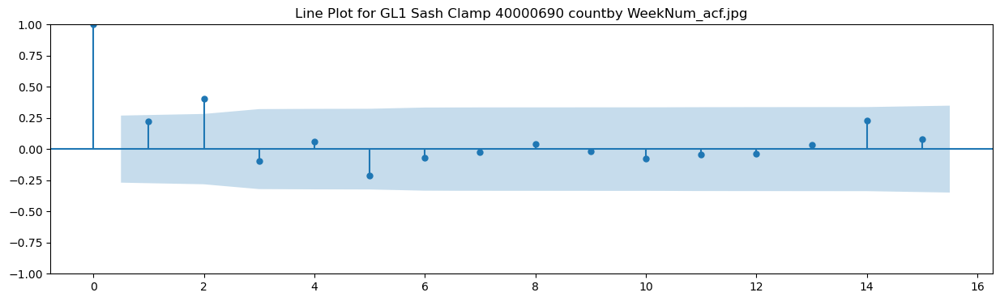

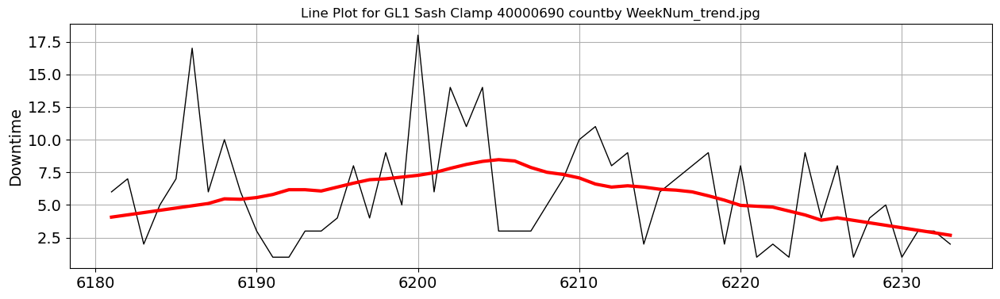

ADF Test Statistic: -3.44
5% Critical Value: -2.92
p-value: 0.01


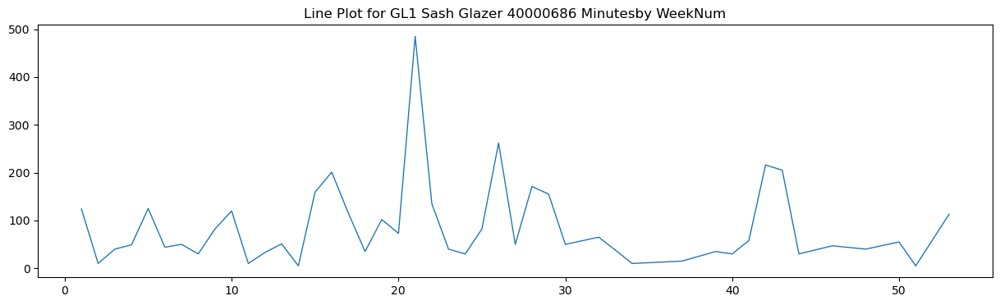

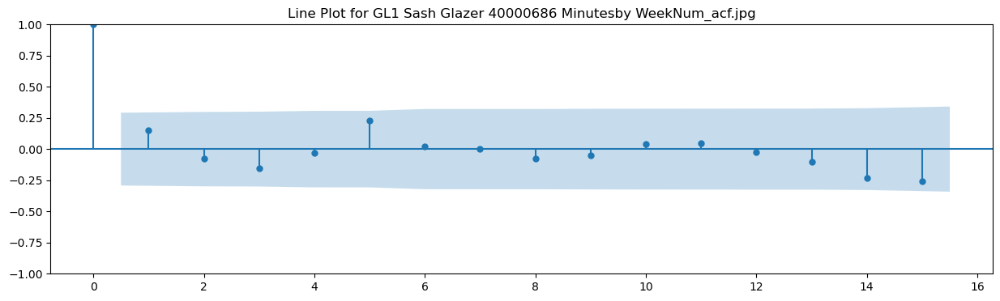

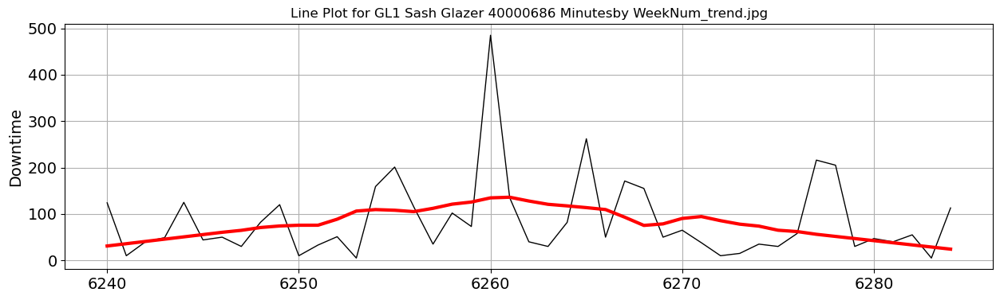

ADF Test Statistic: -5.58
5% Critical Value: -2.93
p-value: 0.00


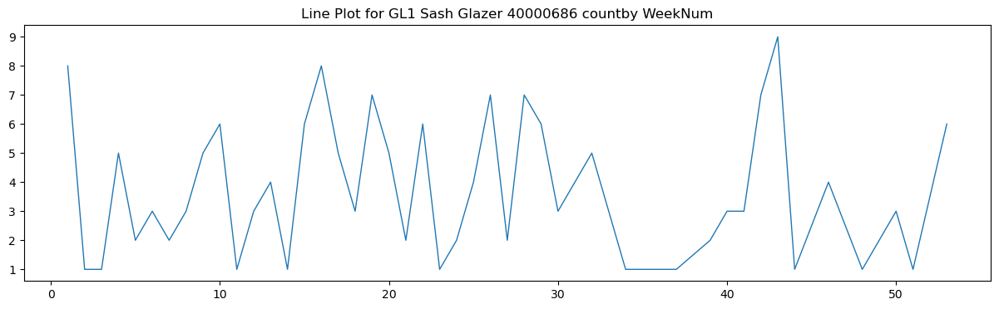

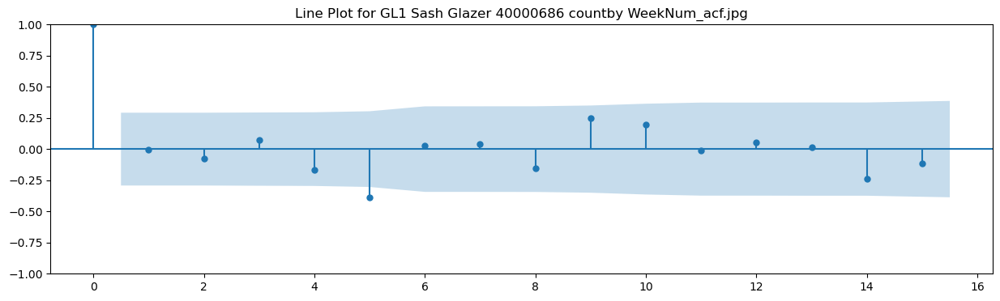

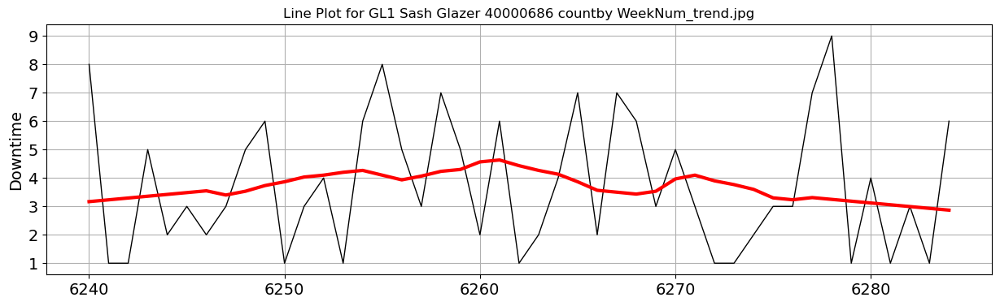

ADF Test Statistic: -4.76
5% Critical Value: -2.94
p-value: 0.00
['GL2 Frame Clamp 40047981', 'GL2 Glass Robot 40047991', 'GL2 Sash Glazer 40047988']


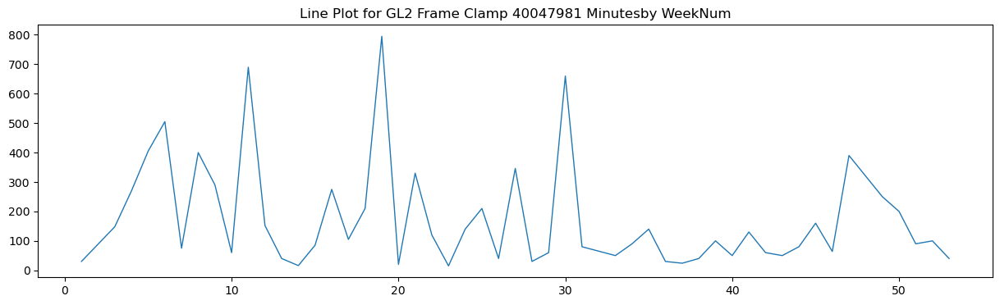

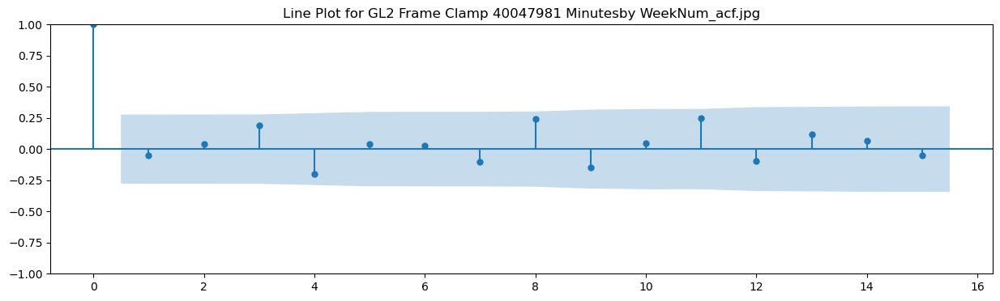

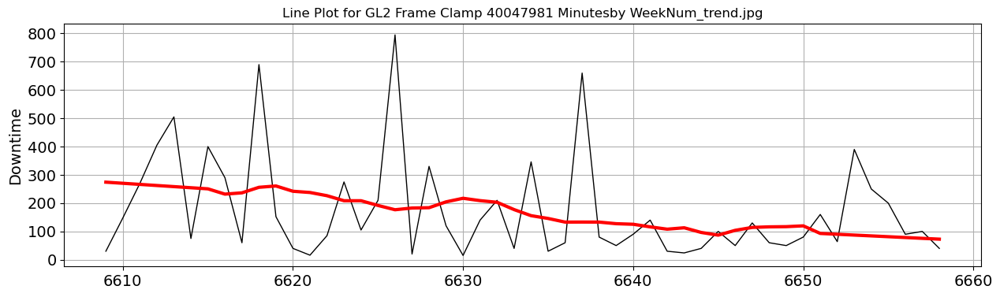

ADF Test Statistic: -7.23
5% Critical Value: -2.92
p-value: 0.00


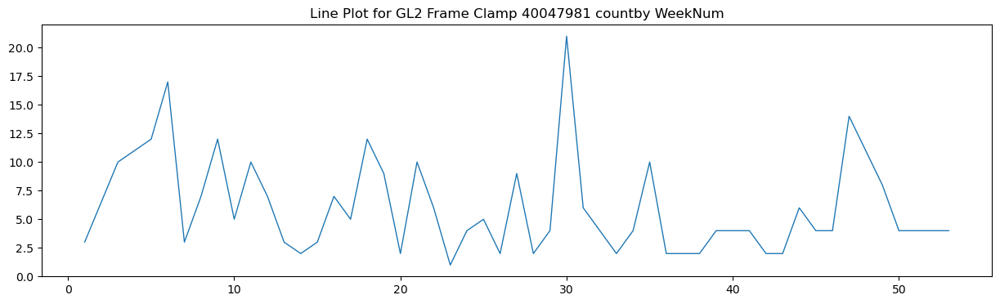

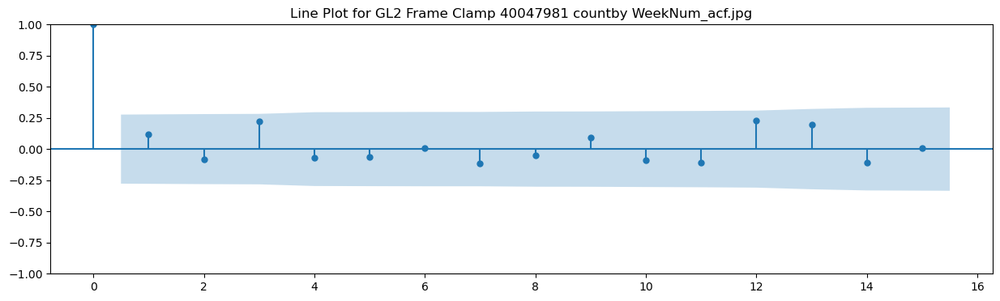

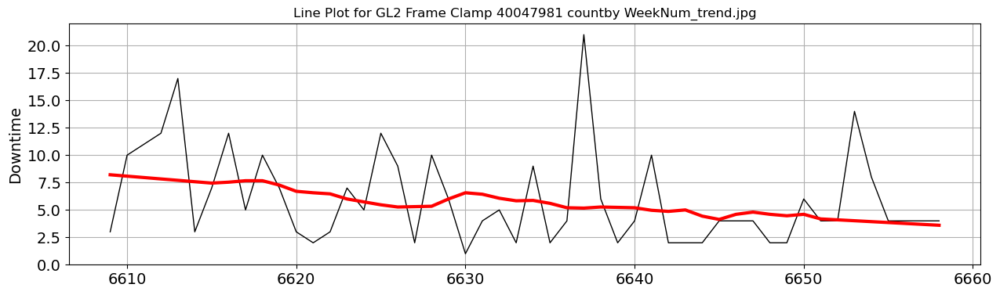

ADF Test Statistic: -4.87
5% Critical Value: -2.92
p-value: 0.00


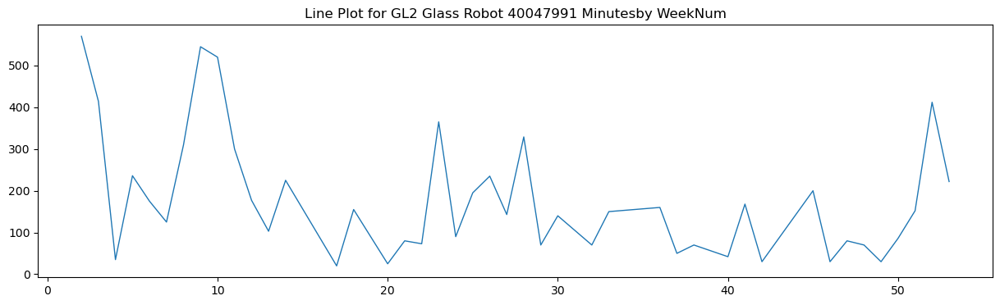

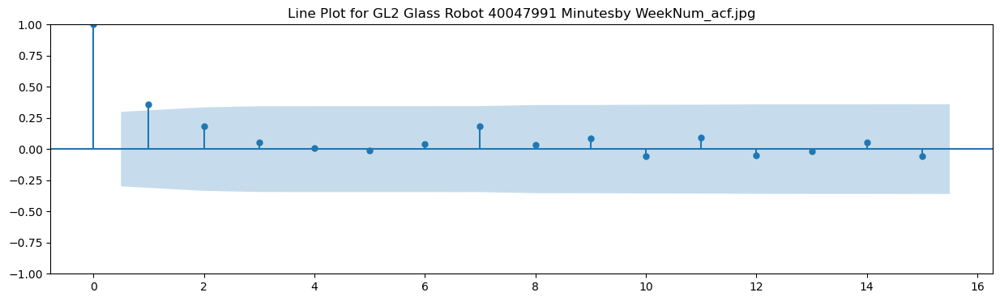

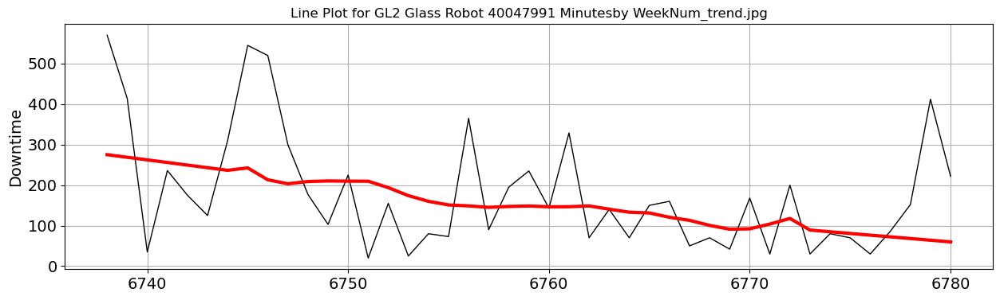

ADF Test Statistic: -4.85
5% Critical Value: -2.93
p-value: 0.00


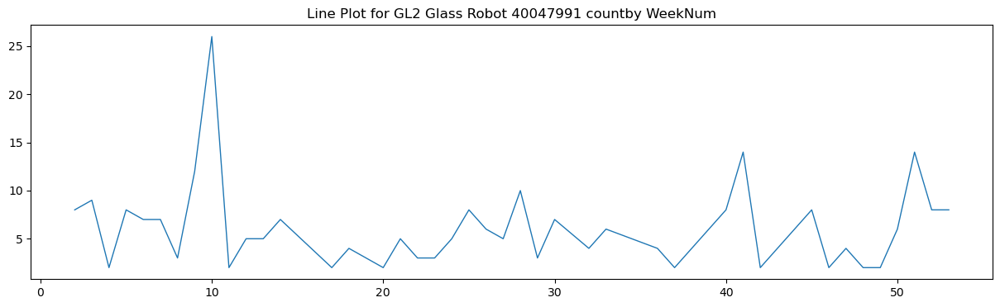

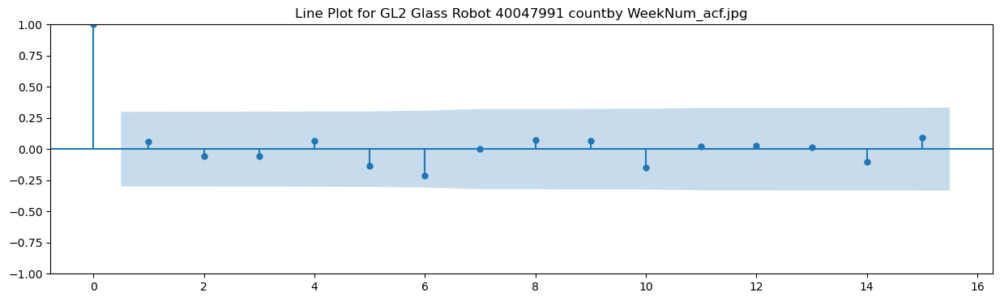

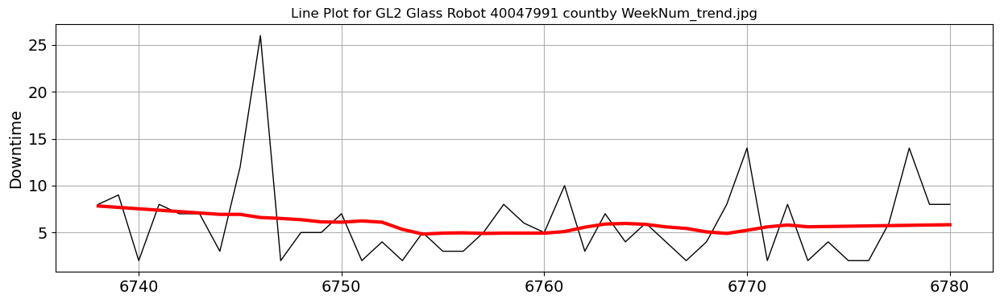

ADF Test Statistic: -5.94
5% Critical Value: -2.93
p-value: 0.00


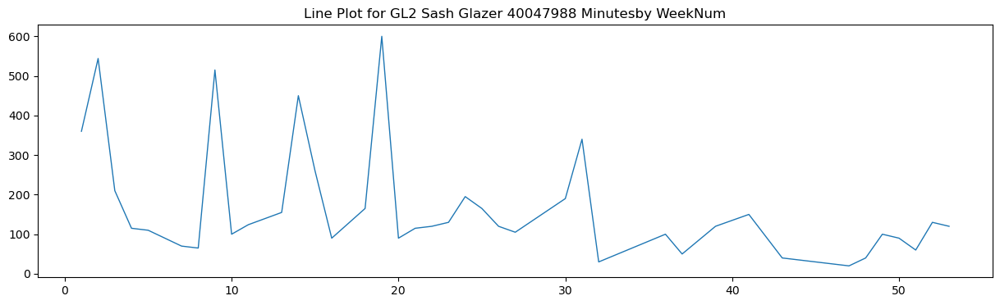

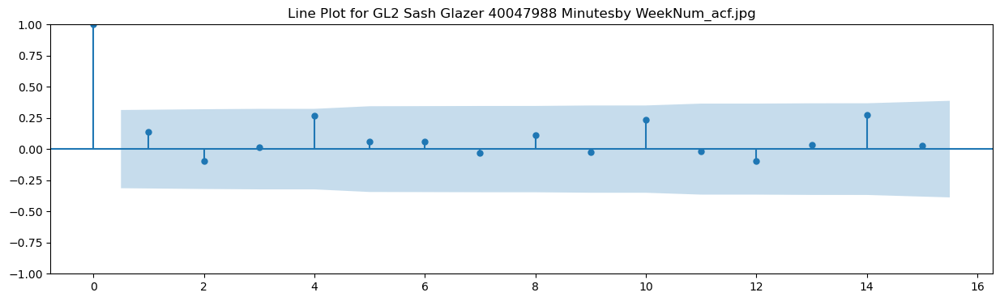

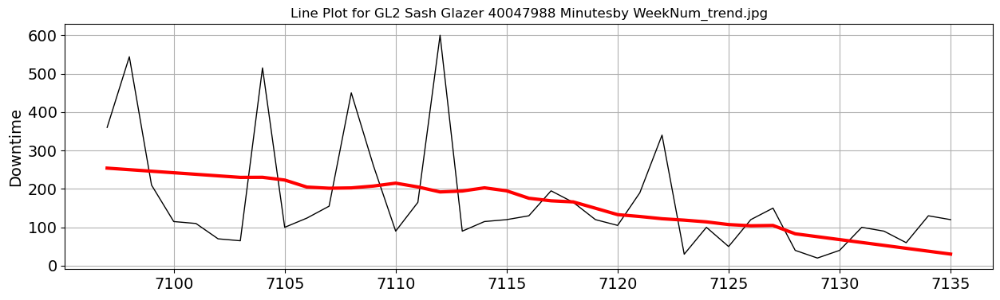

ADF Test Statistic: -0.80
5% Critical Value: -2.97
p-value: 0.82


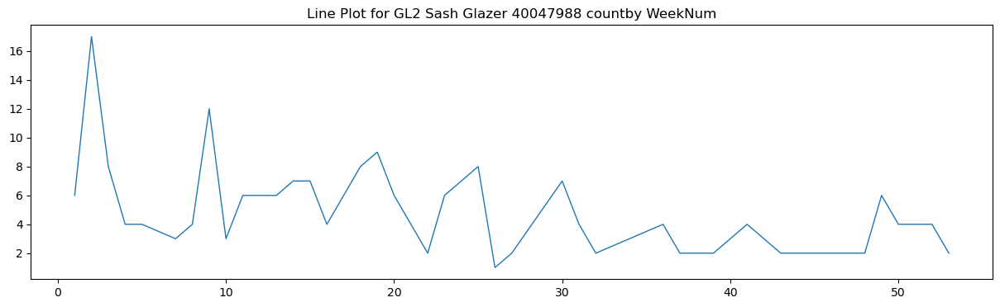

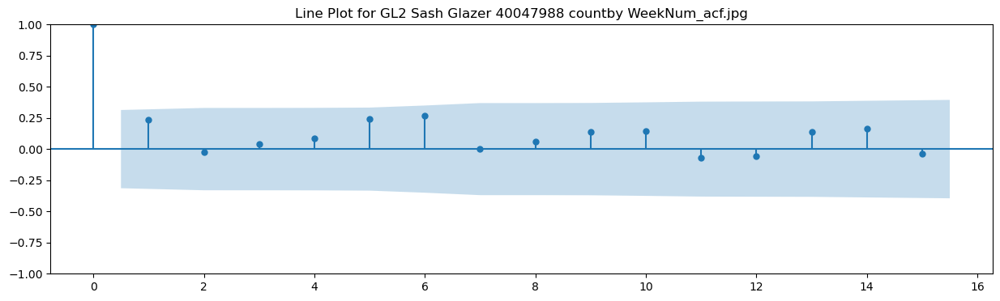

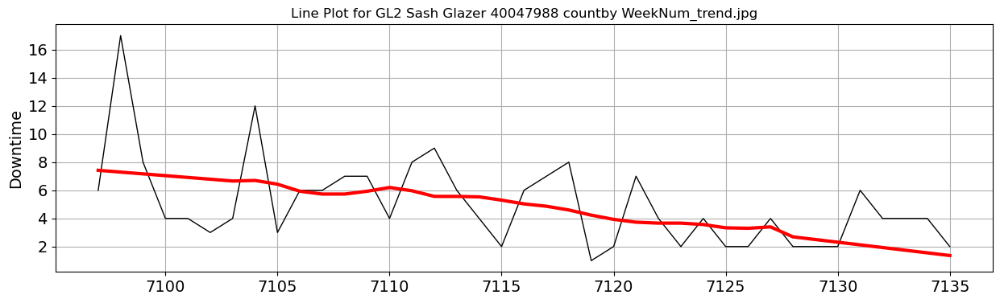

ADF Test Statistic: -1.72
5% Critical Value: -2.95
p-value: 0.42
['PW Frame Welder 40057855', 'New PW Corner Clean 40057856', 'PW Cover Saw C0008523']


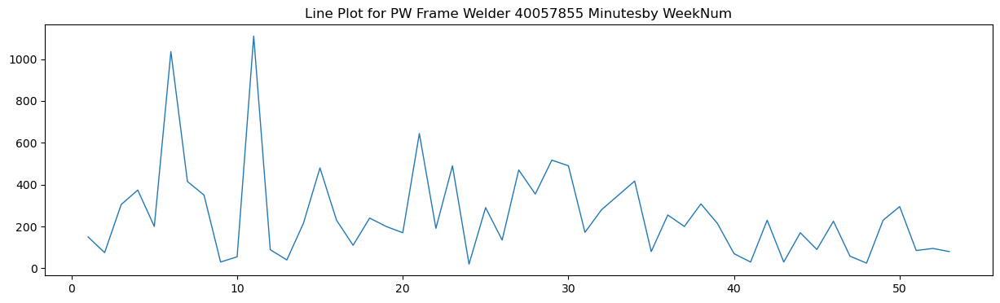

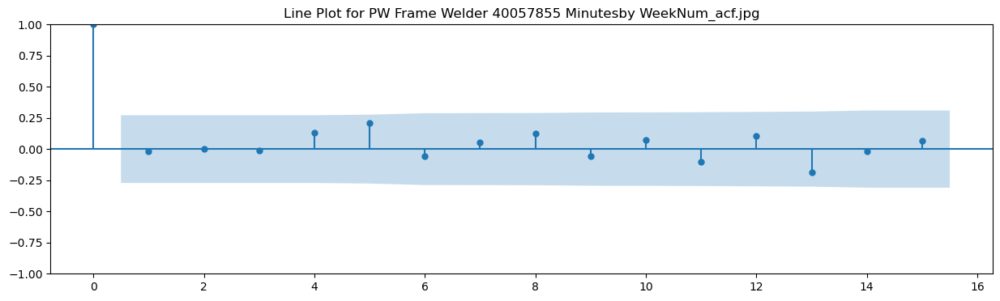

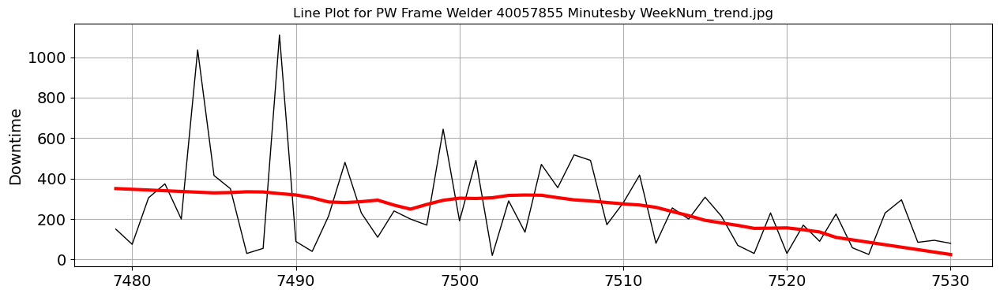

ADF Test Statistic: -7.10
5% Critical Value: -2.92
p-value: 0.00


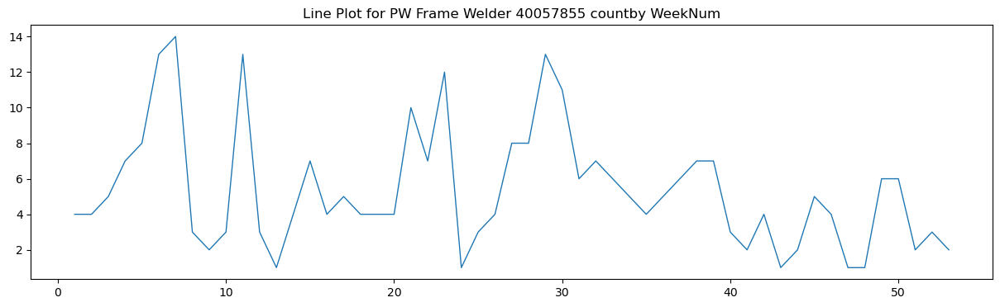

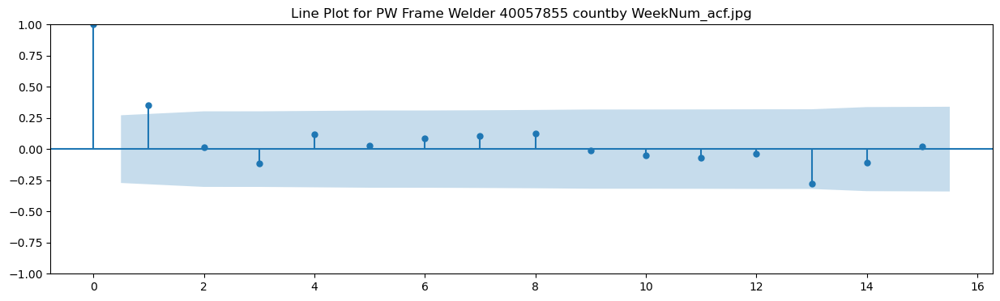

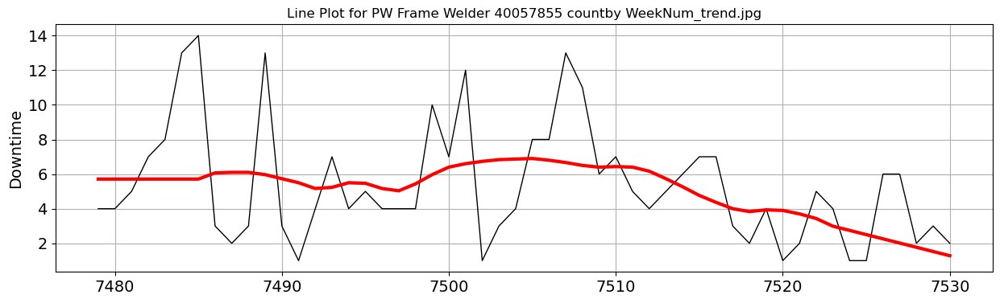

ADF Test Statistic: -4.77
5% Critical Value: -2.92
p-value: 0.00


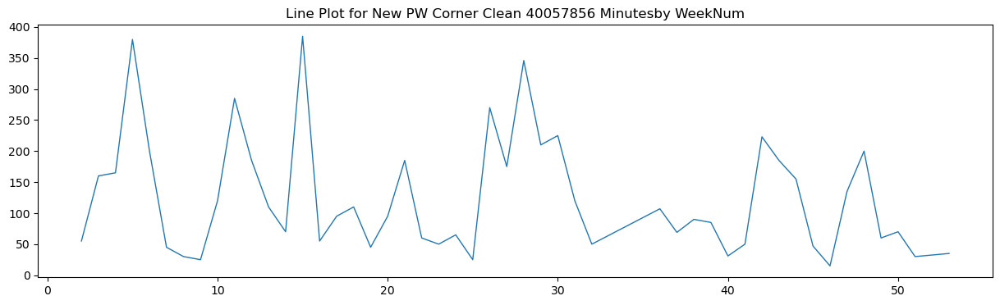

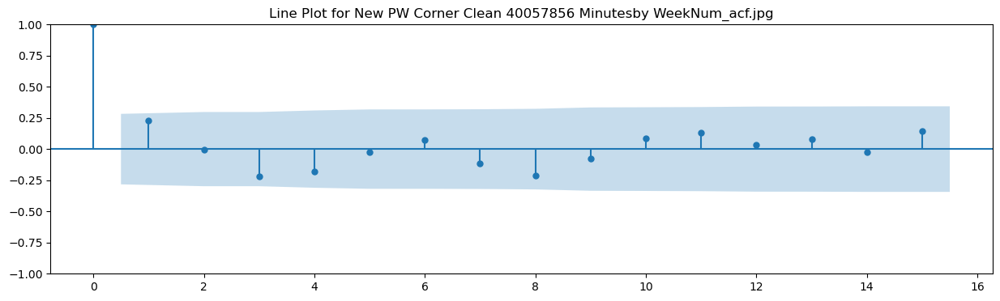

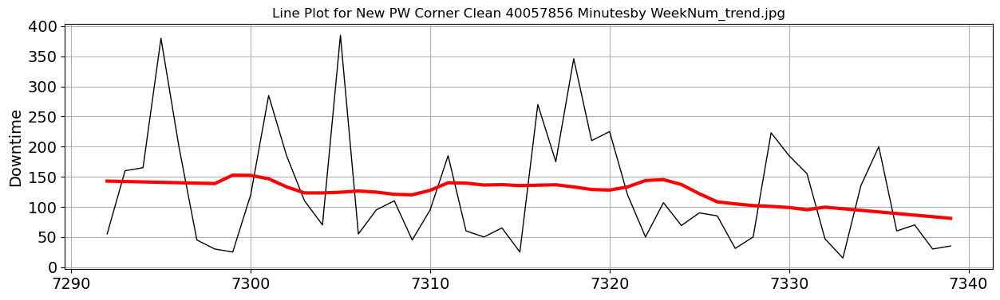

ADF Test Statistic: -5.25
5% Critical Value: -2.93
p-value: 0.00


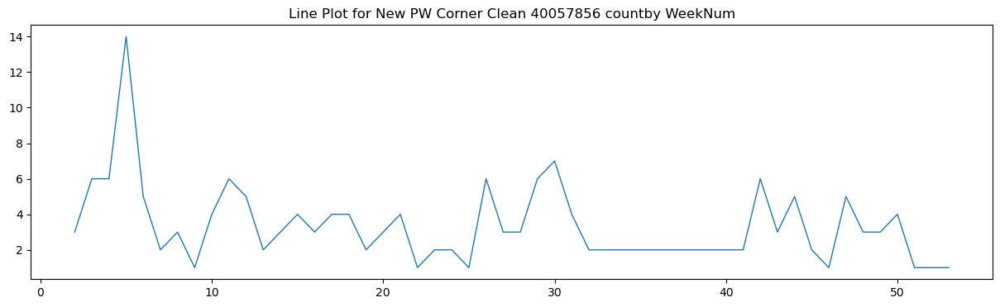

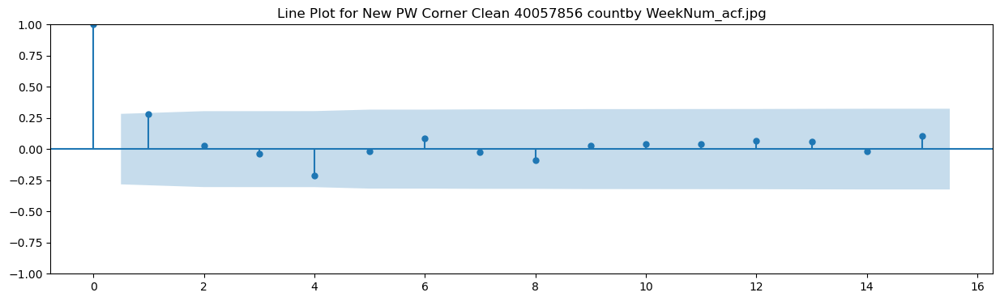

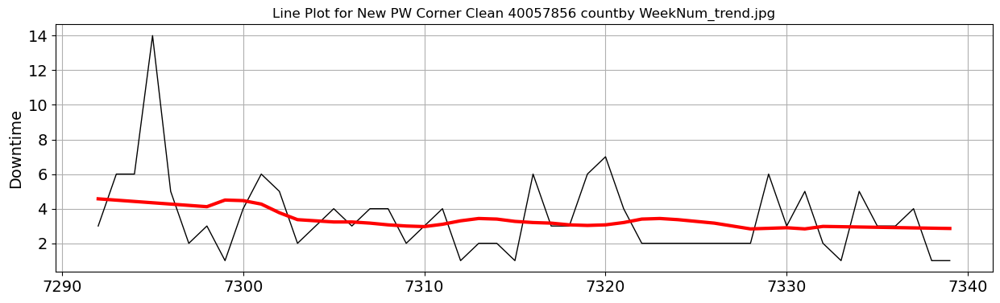

ADF Test Statistic: -4.91
5% Critical Value: -2.93
p-value: 0.00


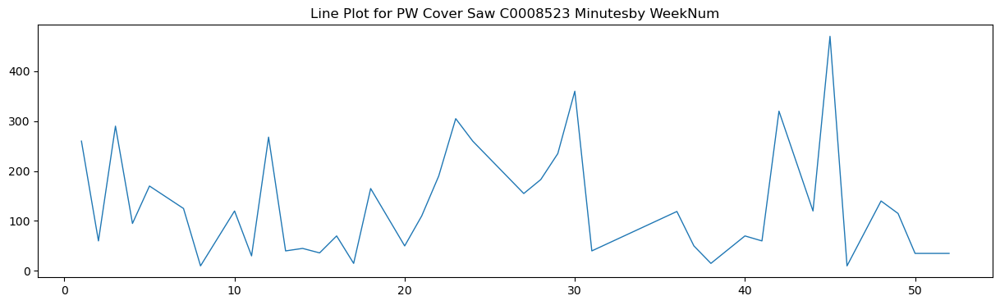

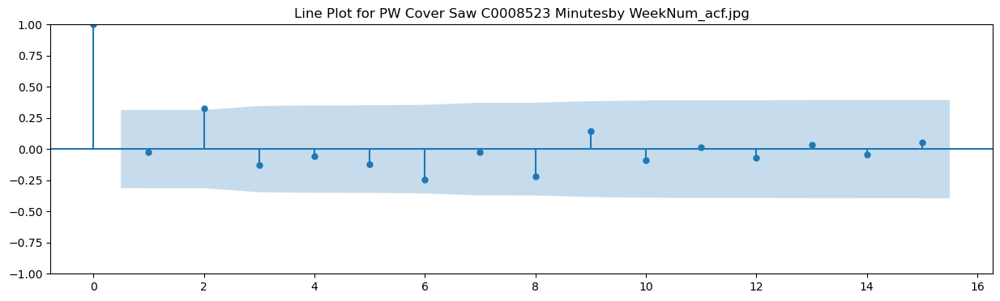

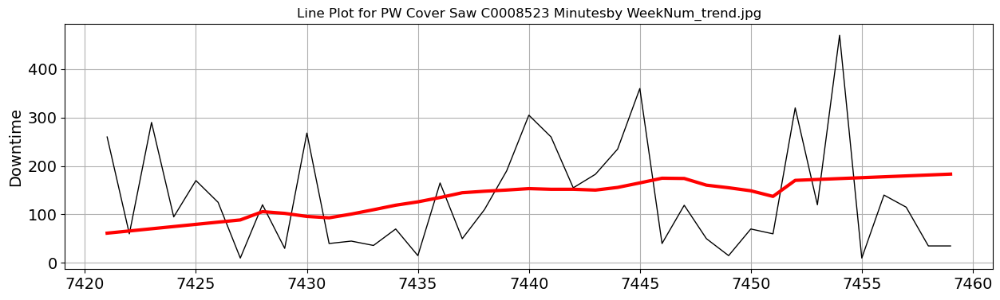

ADF Test Statistic: -2.76
5% Critical Value: -2.94
p-value: 0.06


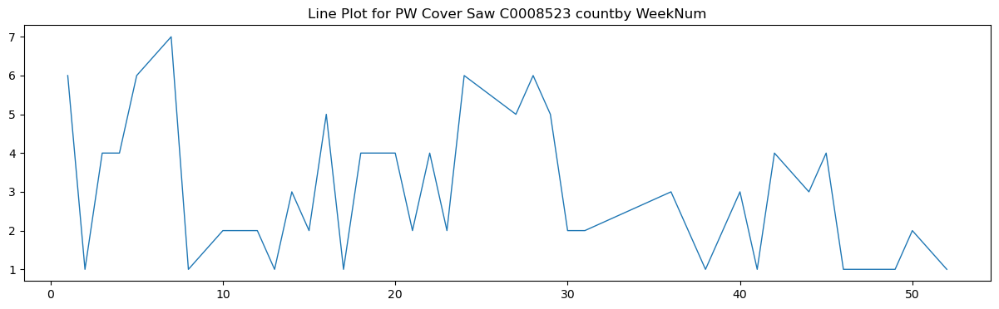

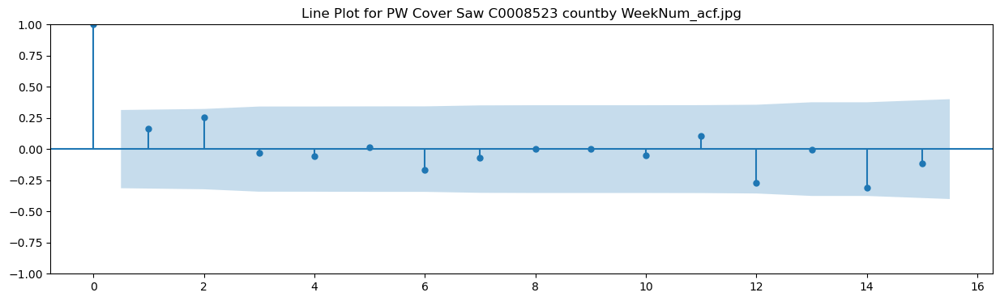

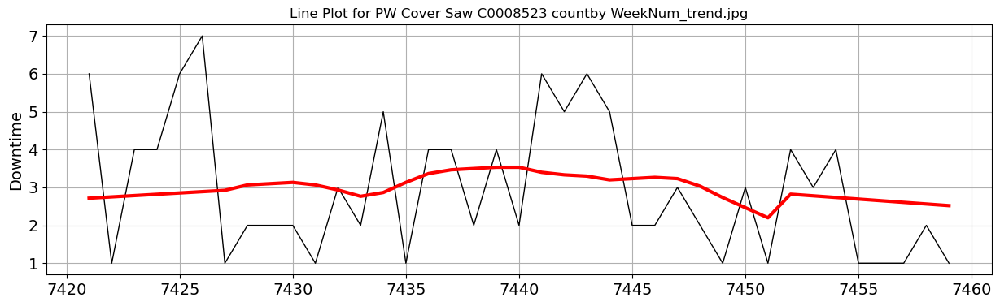

ADF Test Statistic: -2.71
5% Critical Value: -2.94
p-value: 0.07
['SPW Shape Saw C0012675', 'SPW Auto Bending 1 Station', 'SPW Welder 2 C0012801']


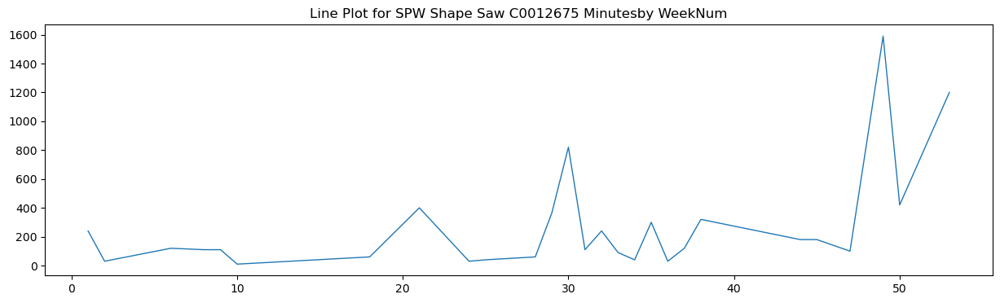

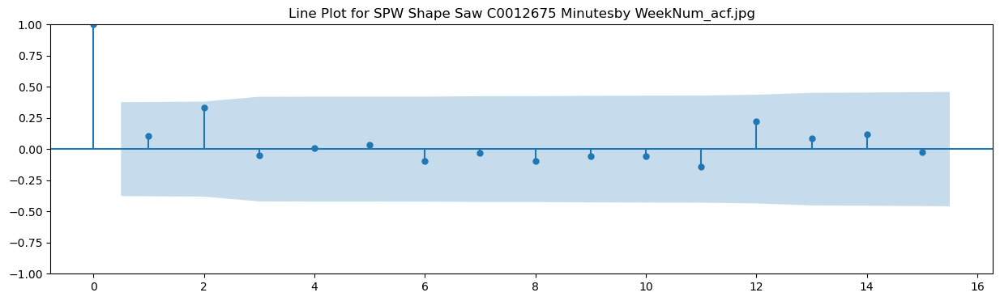

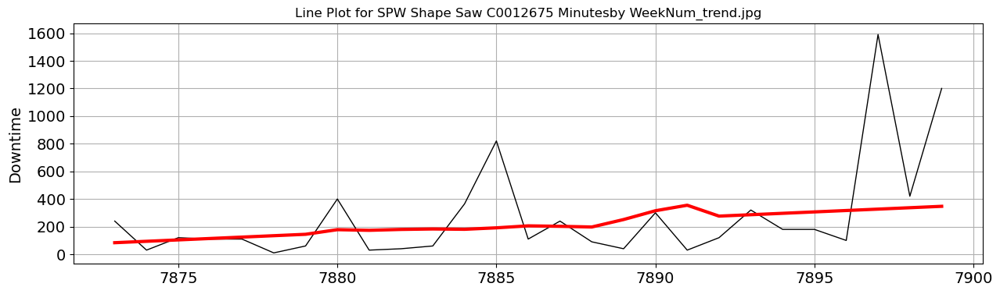

ADF Test Statistic: -1.47
5% Critical Value: -2.99
p-value: 0.55


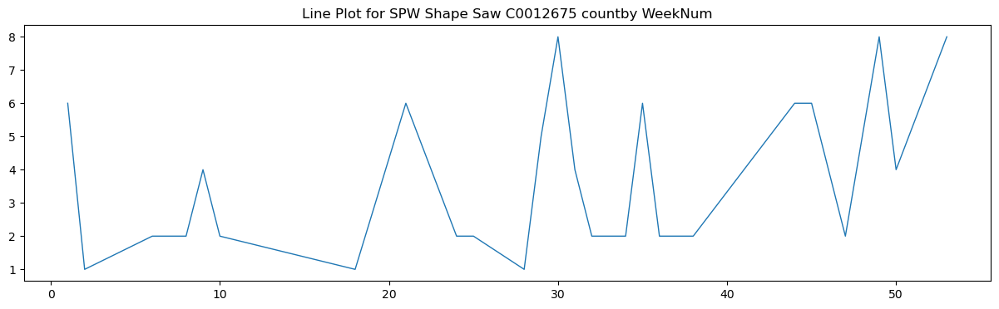

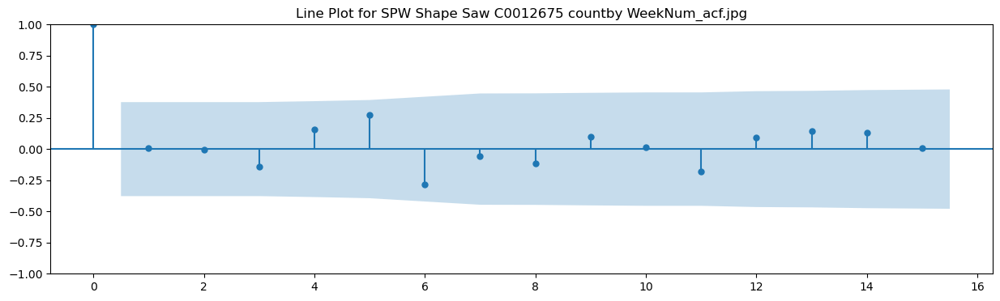

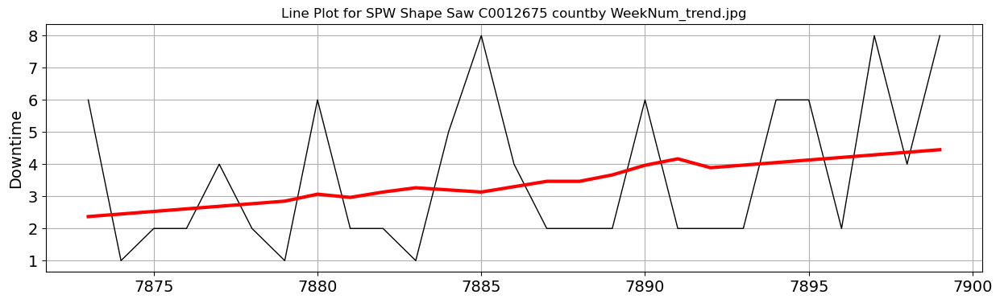

ADF Test Statistic: -1.33
5% Critical Value: -3.01
p-value: 0.61


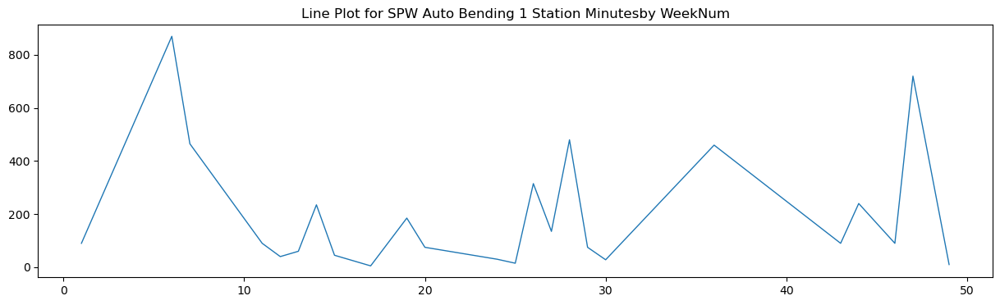

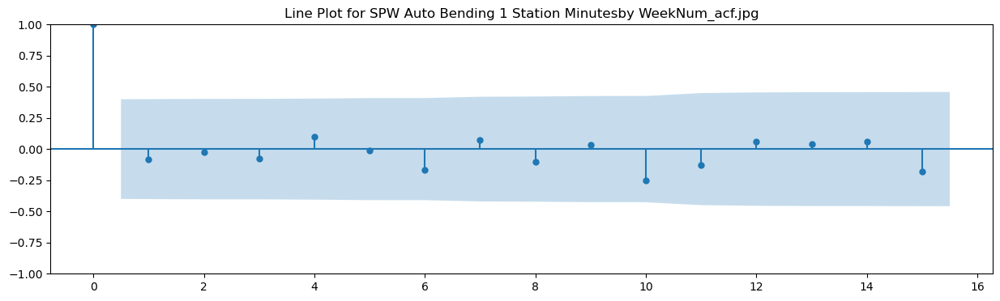

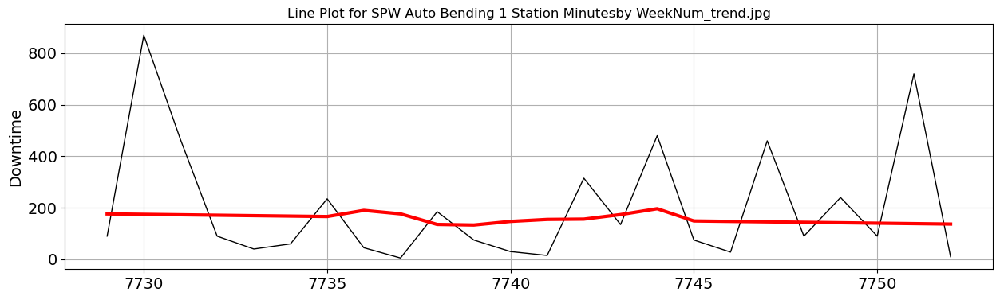

ADF Test Statistic: -4.95
5% Critical Value: -3.00
p-value: 0.00


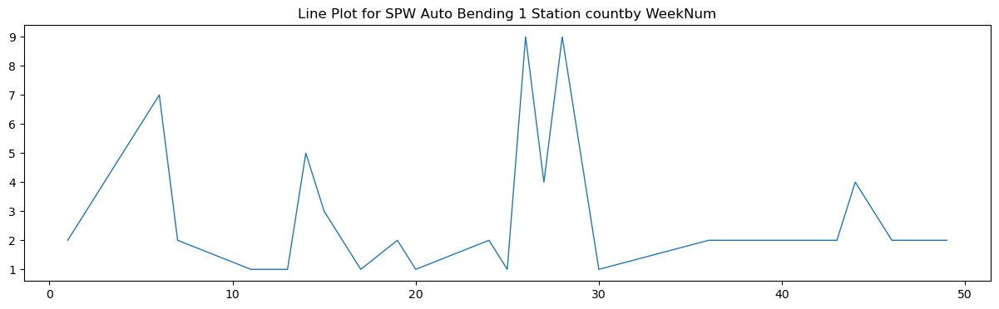

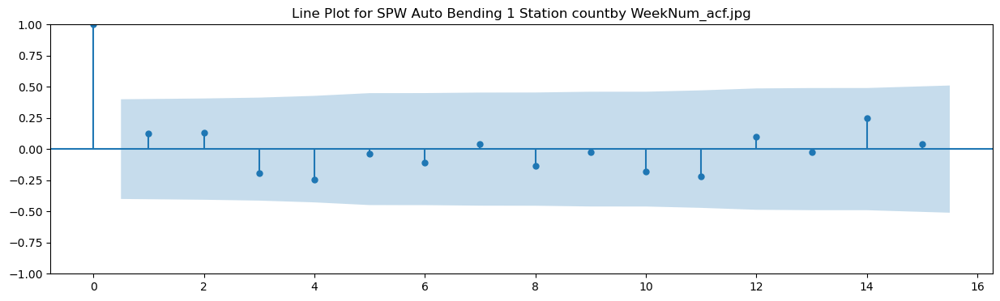

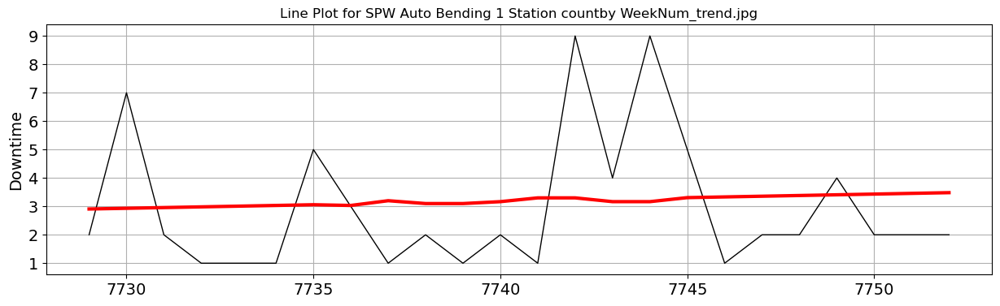

ADF Test Statistic: -4.03
5% Critical Value: -3.00
p-value: 0.00


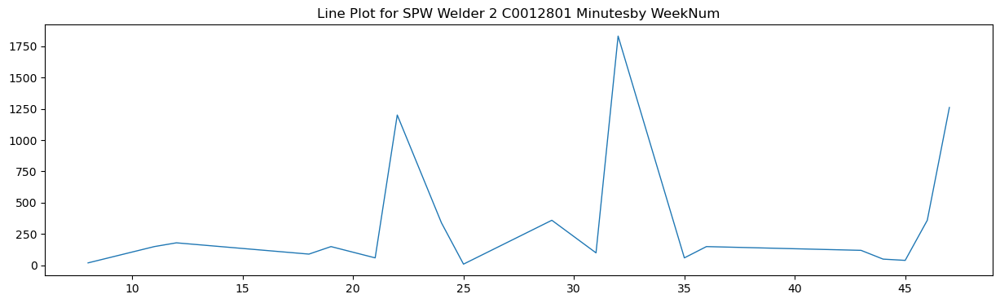

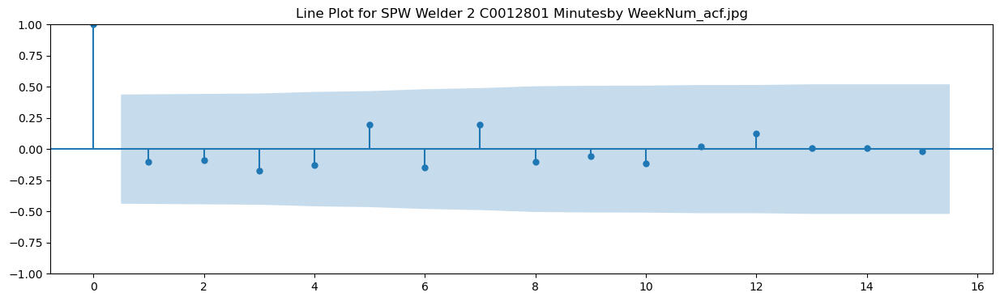

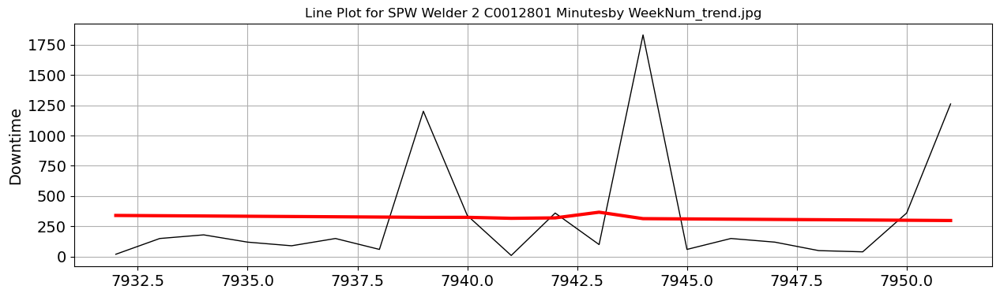

ADF Test Statistic: -4.24
5% Critical Value: -3.03
p-value: 0.00


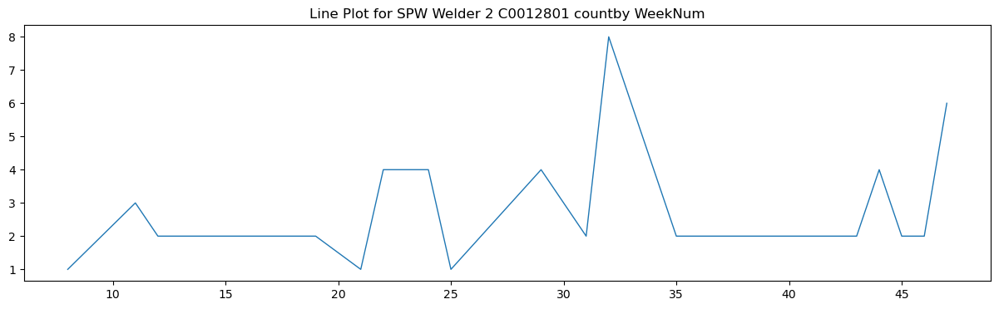

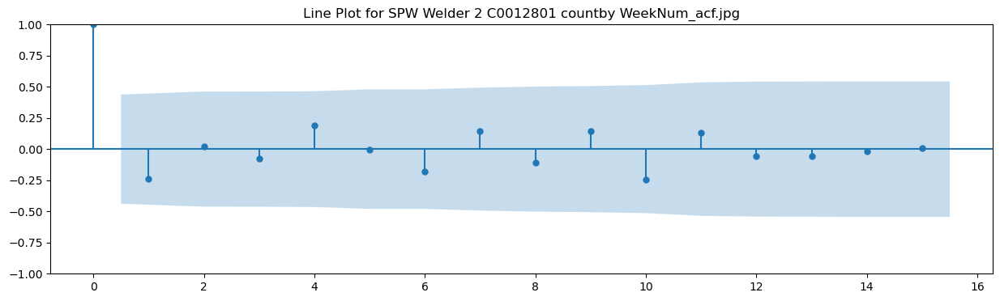

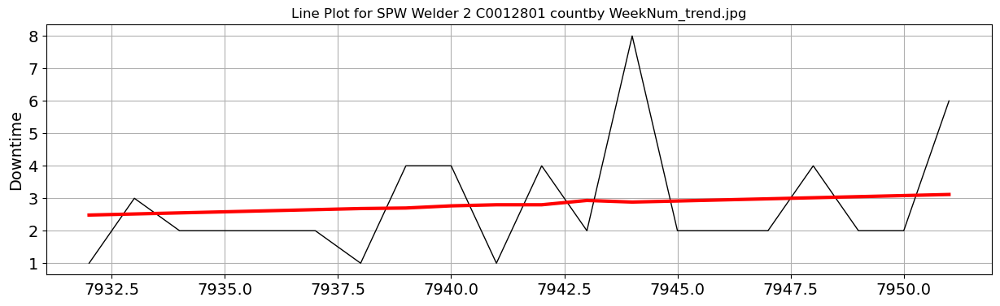

ADF Test Statistic: -5.11
5% Critical Value: -3.03
p-value: 0.00


In [26]:
# Function to perform anslysis for each Asset on each line except BM

for line in enumerate(line_list):
    # pull in data for one line at a time
    data_to_plot = z.where(z['Line'] == line[1]).dropna().groupby(by = 'Asset')[['Asset','Minutes','count']].sum().reset_index()
    data_to_plot.sort_values('count', ascending = False, inplace = True)
    
    # find top 10 asset by downtime minutes
    top_10 = data_to_plot['Asset'].iloc[:3]
    code_list = list(top_10)
    print(code_list)
    for asset in enumerate(code_list):
        # review each asset at a time for the given line 
        
        for factor in enumerate(factor_list):
            # review the time series using Downtime Minutes and Count
            #z_df = z[['Date','Minutes']].where(z['Asset'] == asset[1]).dropna()
            z_df = z[[group_by_category,factor[1]]].where(z['Asset'] == asset[1]).dropna()

            ax = plt.figure(figsize = (15,4))
            #plt.plot('Date','Minutes',linewidth=1,data = z_df)
            plt.plot(group_by_category,factor[1],linewidth=1,data = z_df)
            title = 'Line Plot for ' + str(asset[1]) + ' ' + str(factor[1]) + 'by ' + group_by_category 
            plt.title(title)
            
            filename1 = title + '.jpg'
            plt.savefig(filename1)
            
            # Select period
            period = 15
            filt = np.ones(period + 1)
            filt[0] = 0.5
            filt[-1] = 0.5
            filt /= period
            sum(filt)

            _, ax = plt.subplots(figsize=(15,4))
            #tsaplots.plot_acf(z_df['Minutes'],lags=30, ax=ax)
            tsaplots.plot_acf(z_df[factor[1]],lags=period, ax=ax)
            
            filename2 = title + '_acf' '.jpg'
            plt.savefig(filename2)
            plt.title(filename2)
            plt.show()

            trend = convolution_filter(z_df[factor[1]], filt)
            trend = extrapolate_trend(trend, period + 1)

            plt.figure(figsize=(15,4))
            #plt.plot(z_df['Minutes'],'k',label='data',linewidth=1)
            plt.plot(z_df[factor[1]],'k',label='data',linewidth=1)
            ax = plt.plot(trend,label='trend',color='red',linewidth=3)
            #plt.plot(y_future,'k',alpha=0.5,linewidth=1)
            plt.grid()
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.ylabel('Downtime',fontsize=14)
            
            filename3 = title + '_trend' '.jpg'
            plt.title(filename3)
            plt.savefig(filename3)
            plt.show()
            
            result = adfuller(z_df[factor[1]])
            print('ADF Test Statistic: %.2f' % result[0])
            print('5%% Critical Value: %.2f' % result[4]['5%'])
            print('p-value: %.2f' % result[1])
            


In [ ]:
# tsa and adfuller analysis suggests that most assets have stationary timeseries (i.e. assets with p-value <0.05).

In [27]:
z_df

,WeekNum,count
7932,8.0,1.0
7933,11.0,3.0
7934,12.0,2.0
7935,16.0,2.0
7936,18.0,2.0
7937,19.0,2.0
7938,21.0,1.0
7939,22.0,4.0
7940,24.0,4.0
7941,25.0,1.0


In [28]:
#z_dg1_diff = z_dg1.diff().dropna()

NameError: name 'z_dg1' is not defined

In [ ]:
#z_dg1_diff 

In [ ]:
#ax = plt.figure(figsize = (15,4))
#plt.plot('Minutes',linewidth=1,data = z_dg1)

NameError: name 'z_dg1' is not defined

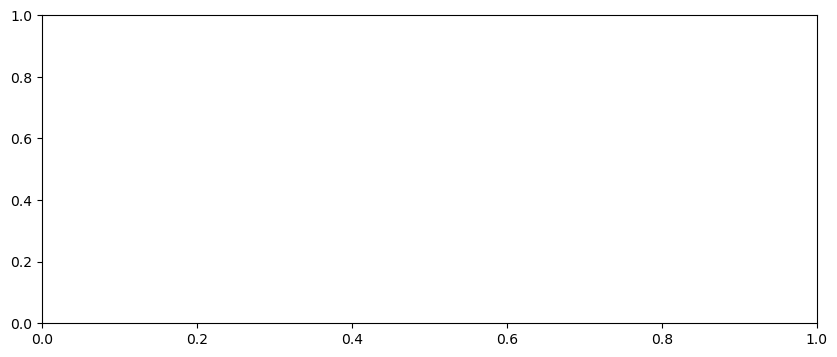

In [137]:
#_, ax = plt.subplots(figsize=(10,4))
#tsaplots.plot_acf(z_dg1['Minutes'],lags=100, ax=ax)
#plt.show()


In [29]:
df.head()

,Date,Shift,Period,Week,Asset,Category,Minutes,Comments,Line,Daily DT/ Shift (Mins),...,WorkingDay,PeriodAvgDT/Shift,WeekNum,Year,Year_Week_Calc,Counter_wk,Counter_Pd,Category (groups),Period_View,count
0,2022-01-24,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 frame damaged on line,DG1,3.692308,...,0.027239,0.445665,5.0,2022.0,2022-5,79,17,Other,1.0,1
1,2022-01-24,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 damaged sill,DG1,3.692308,...,0.027239,0.445665,5.0,2022.0,2022-5,79,17,Other,1.0,1
2,2022-01-24,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 bad glass- sightline from supplier 811948-7 ...,DG1,3.692308,...,0.027239,0.445665,5.0,2022.0,2022-5,79,17,Other,1.0,1
3,2022-01-26,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 Frame Gap,DG1,3.000000,...,0.027239,0.445665,5.0,2022.0,2022-5,79,17,Other,1.0,1
4,2022-01-27,3.0,1.0,4.0,DG1 Sash Hang Station,Process Defect,3.0,1 lower interior m&t gap,DG1,3.000000,...,0.027239,0.445665,5.0,2022.0,2022-5,79,17,Other,1.0,1


In [93]:
df['Asset'].value_counts().nlargest(10)

SPW Glass Lay In Station          5410
GL2 Glass Lay Station             3520
SPW Standard Finishing Station    3514
SPW Auto Bending 3 Station        2856
spw welding station               2417
SPW Shapes Fabrication Station    1995
CS1 Frame Tenoner Station         1765
DG1 Sash Hang Station             1619
BM Packing A Station              1602
PW Glass Lay In Station           1560
Name: Asset, dtype: int64

In [139]:
data_to_plot = df.where(df['Asset'] == 'SPW Glass Lay In Station').dropna().groupby(by = ['Asset','Date'])[['Asset','WeekNum','Date','Minutes','count']].sum().reset_index()
data_to_plot.sort_values(by = ['Asset','Date'], inplace = True)
data_to_plot.set_index('Date')

,Asset,WeekNum,Minutes,count
Date,,,,
2022-01-06,SPW Glass Lay In Station,20.0,100.0,10.0
2022-01-07,SPW Glass Lay In Station,8.0,30.0,4.0
2022-01-10,SPW Glass Lay In Station,6.0,30.0,2.0
2022-01-11,SPW Glass Lay In Station,24.0,110.0,8.0
2022-01-12,SPW Glass Lay In Station,24.0,60.0,8.0
...,...,...,...,...
2023-07-19,SPW Glass Lay In Station,29.0,10.0,1.0
2023-07-25,SPW Glass Lay In Station,30.0,5.0,1.0
2023-07-26,SPW Glass Lay In Station,30.0,5.0,1.0


In [140]:
# split the data in to Train and Test Dataset 

train_data = data_to_plot.where(data_to_plot['Date'].dt.year == 2022)[['Date','Minutes']].dropna().set_index('Date')
test_data = data_to_plot.where(data_to_plot['Date'].dt.year == 2023)[['Date','Minutes']].dropna().set_index('Date')

In [141]:
#from datetime import datetime as dt

#rain_data['Date_obj'] = train_data['Date'].apply(lambda x: dt.strftime(x, '%Y-%m-%d'))



In [142]:
#train_data = train_data.drop(columns = ['Asset','WeekNum','count'])

#train_data = train_data.drop(columns = 'Date_obj').set_index('Date')

In [143]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 146 entries, 2022-01-06 to 2022-12-30
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Minutes  146 non-null    float64
dtypes: float64(1)
memory usage: 2.3 KB


In [153]:
stl = STL(train_data, period = 15)
results = stl.fit()

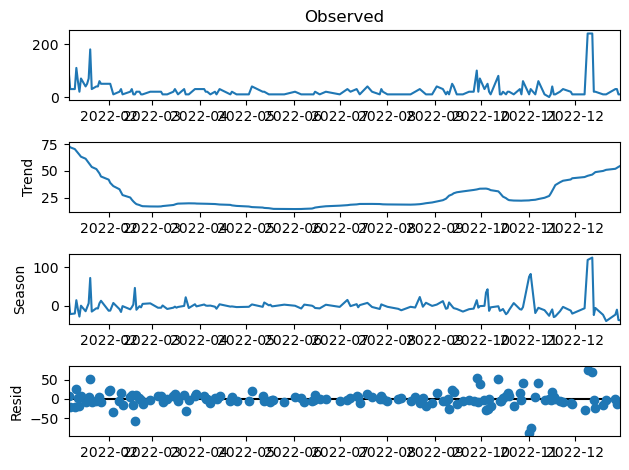

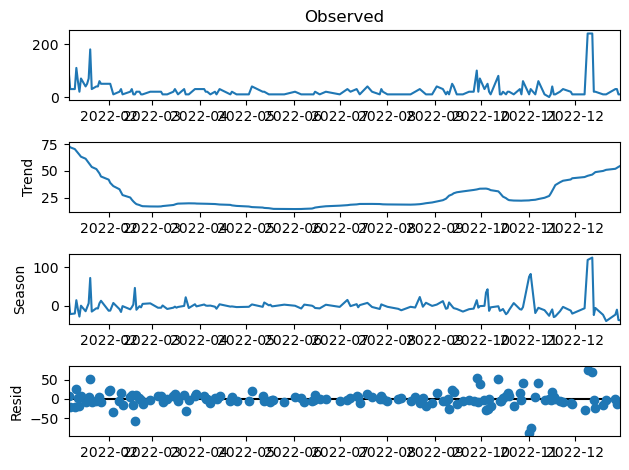

In [154]:
results.plot()

In [155]:
#train_data = train_data.drop(columns = 'Date')
stlf = STLForecast(train_data, ARIMA, period = 15, model_kwargs={'order':(1, 1, 0), 'trend':"t"})

In [156]:
stlf_results = stlf.fit()

In [157]:
forecast = stlf_results.forecast(len(test_data))

In [158]:
forecast

146    32.732594
147    44.105364
148    34.303635
149    26.329488
150    40.001897
         ...    
214    29.518703
215    11.567160
216    -4.847509
217    11.667507
218    24.330586
Length: 73, dtype: float64

<Axes: >

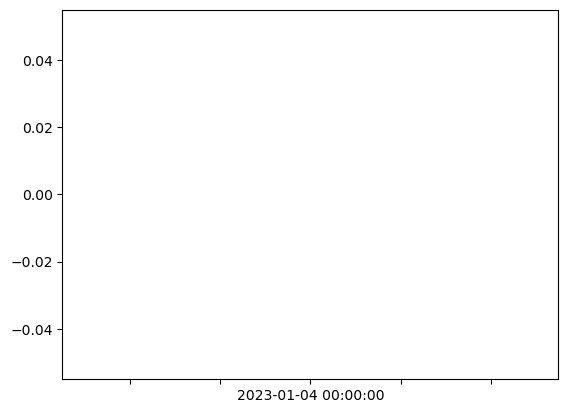

In [159]:
error = forecast - test_data['Minutes']
error.plot()

In [151]:
error.info()

<class 'pandas.core.series.Series'>
Index: 146 entries, 2023-01-04 00:00:00 to 218
Series name: None
Non-Null Count  Dtype  
--------------  -----  
0 non-null      float64
dtypes: float64(1)
memory usage: 2.3+ KB


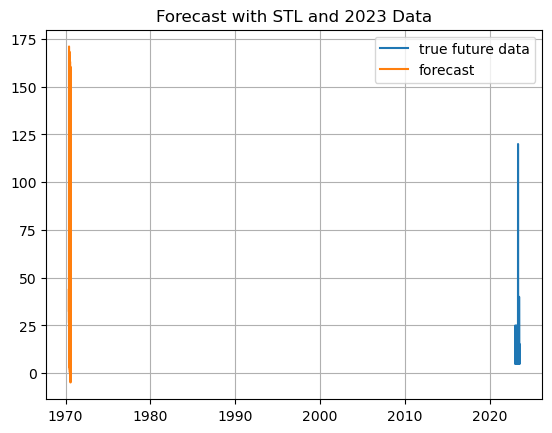

In [152]:
plt.plot(test_data['Minutes'], label = 'true future data')
plt.plot(forecast, label = 'forecast')
plt.legend()
plt.title('Forecast with STL and 2023 Data')
plt.grid();

In [161]:
from sklearn.model_selection import GridSearchCV

In [ ]:
param_grid = {5,10,15,20,25}

In [ ]:
stlf_grid = STLForecast(train_data, ARIMA, period = param_grid, model_kwargs={'order':(1, 1, 0), 'trend':"t"})

In [ ]:
grid = GridSearchCV()